Load Packages and settings

In [9]:
from sklearn.metrics import r2_score
from scipy.stats import gaussian_kde 
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from sklearn.metrics import r2_score
import xarray as xr

#select particular representative gauge
reg = 'SR'

if reg == 'CT':
    columnname = str(54)
    mask_size = '892'
elif reg == 'SR':
    columnname = str(38)
    mask_size = '961'

MLDir = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami' 
SimDir = "/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/simu/"

list_size = ['961','1773','3669','6941']
mask_size = list_size[0]
train_size = list_size[1]

Sample based on event information from INGV catalog

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import contextily as cx
import os

#select particular representative gauge
reg = 'SR'

if reg == 'CT':
    columnname = str(38)
    train_size = '3454'
    mask_size = '892'
elif reg == 'SR':
    columnname = str(54)
    train_size = '961'
    mask_size = '961'

MLDir = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami' 
eve_info = pd.read_csv(f'{MLDir}/resources/processed/allinfo_eventsBS_PS53550.csv',sep=',')
offshore_info = pd.read_csv(f'{MLDir}/data/info/grid0_allpts87_alleve53550.offshore.txt',sep='\t')
period_info = pd.read_csv(f'{MLDir}/data/info/grid0_allpts87_alleveWP53550.offshore.txt',sep='\t')
dperiod_info = pd.read_csv(f'{MLDir}/data/info/grid0_allpts87_alleveDP53550.offshore.txt',sep='\t')
onshore_info = pd.read_csv(f'{MLDir}/data/info/CHeight_{reg}_alleve53550.onshore.txt',sep='\t')
#add eve_id to offshore_info and onshore_info by splitting id at /

#mange id column
eve_info.rename(columns={'ID':'eve_id'}, inplace=True)
offshore_info['eve_id'] = offshore_info['id'].str.split('/').str[1]
onshore_info['eve_id'] = onshore_info['id'].str.split('/').str[1]
period_info['eve_id'] = period_info['id'].str.split('/').str[1]
dperiod_info['eve_id'] = dperiod_info['id'].str.split('/').str[1]

#keep only column gaugeno and eve_id
offshore_info = offshore_info[['eve_id',columnname]]
offshore_info.rename(columns={columnname:'max_off'}, inplace=True)

period_info = period_info[['eve_id',columnname]]
period_info.rename(columns={columnname:'wave_period'}, inplace=True)

dperiod_info = dperiod_info[['eve_id',columnname]]
dperiod_info.rename(columns={columnname:'dominant_period'}, inplace=True)

# onshore_info = onshore_info[['eve_id','max']]

#merge offshore, onshore and period
combined = pd.merge(offshore_info, onshore_info, on='eve_id', how='left')
combined = pd.merge(combined, period_info, on='eve_id', how='left')
combined = pd.merge(combined, dperiod_info, on='eve_id', how='left')
#merge combined with eve_info
combined = pd.merge(combined, eve_info, on='eve_id', how='left')

/tmp/ipykernel_6797/184904084.py:20: DtypeWarning: Columns (6,7,8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  eve_info = pd.read_csv(f'{MLDir}/resources/processed/allinfo_eventsBS_PS53550.csv',sep=',')


In [2]:
#get column names
# combined.columns.values.tolist()
# ['eve_id',
#  '41', #offshore gauge selected for sampling
#  'id',
#  'count',
#  'max',
#  'logsum',
#  'mean',
#  'sd',
#  'dzmin',
#  'dzmax',
#  'Source_Region',
#  'Type',
#  'Mag',
#  'lon',
#  'lat',
#  'SlipModel',
#  'Scaling',
#  'RuptureModel',
#  'Rigidity',
#  'Depth',
#  'Strike',
#  'Dip',
#  'Rake',
#  'Length',
#  'Area',
#  'Slip',
#  'Location',
#  'LocationCount',
#  'mean_prob']

# #create a new dataframe with only the columns we need
# combined = combined[['eve_id','id',columnname,'mean_prob','dzmax','dzmin','dmax','lon','lat','Location','LocationCount']]

# #rename column gauge to max_off and change type to double
# combined.rename(columns={columnname:'max_off'}, inplace=True)
# combined['max_off'] = combined['max_off'].astype(np.double)


In [3]:
# #create a new dataframe with only the columns we need
combined = combined[['eve_id','id','max_off','wave_period','dominant_period','mean_prob','dzmax','dzmin','count','dmax','lon','lat','Location','LocationCount']]

#get max abs deformation
combined['max_absdz'] = combined[['dzmax','dzmin']].abs().max(axis=1)

#if absolute value of dzmax or dzmin is less than 0.1, set event_type to 'near'(0) ie  else 'far'(1)
combined['event_type'] = combined['max_absdz'].apply(lambda x: 1 if abs(x)<0.1 else 0).astype(np.double)
# combined['event_type'] = combined['dzmax'].apply(lambda x: 1 if x<0.2 else 0).astype(np.double)

#importance variable
combined['importance'] = combined['mean_prob'] * combined['max_off'].astype(np.double)

# #count when importance is 0
# combined[combined['importance']==0]
# #set importance to 1e-10  if importance is 0
# combined['importance'] = combined['importance'].apply(lambda x: 1e-10 if x==0 else x)


#count number of events in each cluster of event_type
print(combined.groupby('event_type').count())

#create uniform weights column
combined['uniform_wt'] = 1/len(combined)


            eve_id     id  max_off  wave_period  dominant_period  mean_prob  \
event_type                                                                    
0.0           9186   9186     9186         9186             9186       9186   
1.0          44364  44364    44364        44364            44364      44364   

            dzmax  dzmin  count   dmax    lon    lat  Location  LocationCount  \
event_type                                                                      
0.0          9186   9186   9186   9186   9186   9186      9186           9186   
1.0         44364  44364  44364  44364  44364  44364     44364          44364   

            max_absdz  importance  
event_type                         
0.0              9186        9186  
1.0             44364       44364  


#add grid count based on grid size of 0.3 degree *110 lm--> 33 km

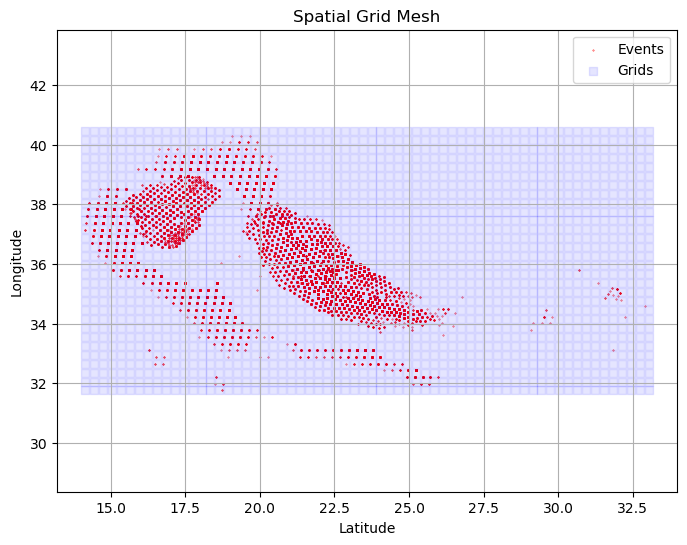

In [4]:
# Calculate the extent of latitude and longitude
min_lat = combined['lat'].min()
max_lat = combined['lat'].max()
min_lon = combined['lon'].min()
max_lon = combined['lon'].max()

# Define the size of the grid
grid_size = 0.3

# Create the latitude and longitude grids centre
lat_grids = np.arange(min_lat, max_lat + grid_size, grid_size)
lon_grids = np.arange(min_lon, max_lon + grid_size, grid_size)

# Create a meshgrid of latitude and longitude
mesh_lon,mesh_lat = np.meshgrid(lon_grids,lat_grids,)

# Plot the grid mesh
plt.figure(figsize=(8, 6))
plt.scatter(combined['lon'], combined['lat'], color='red', label='Events',s=0.1)
plt.scatter(mesh_lon,mesh_lat, color='blue', alpha=0.1, label='Grids', s=40, marker='s')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Spatial Grid Mesh')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

In [5]:
# Calculate the number of events per grid
grid_counts = {}
for i in range(len(lat_grids) - 1):
    for j in range(len(lon_grids) - 1):
        lat_min, lat_max = lat_grids[i], lat_grids[i+1]
        lon_min, lon_max = lon_grids[j], lon_grids[j+1]
        count = combined[(combined['lat'] >= lat_min) & (combined['lat'] < lat_max) &
                         (combined['lon'] >= lon_min) & (combined['lon'] < lon_max)].shape[0]
        if count > 0:
            grid_id = f"{lat_min.round(3)},{lon_min.round(3)}"
            grid_counts[grid_id] = count

# Assign grid counts and grid ID to events
combined['gridcount'] = np.nan
combined['grid_id'] = np.nan
for index, event in combined.iterrows():
    lat, lon = event['lat'], event['lon']
    for grid_id, count in grid_counts.items():
        lat_min, lon_min = map(float, grid_id.split(","))
        lat_max, lon_max = lat_min + grid_size, lon_min + grid_size
        if lat_min <= lat < lat_max and lon_min <= lon < lon_max:
            combined.at[index, 'gridcount'] = count
            combined.at[index, 'grid_id'] = grid_id
            break

#if any entry nan for gridcount, set it to copy value of row above
combined['gridcount'] = combined['gridcount'].fillna(method='ffill')
combined['grid_id'] = combined['grid_id'].fillna(method='ffill')

In [6]:
# #'save combined to csv'
combined.to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/info/sampling_input_{reg}_{columnname}.csv',index=False)

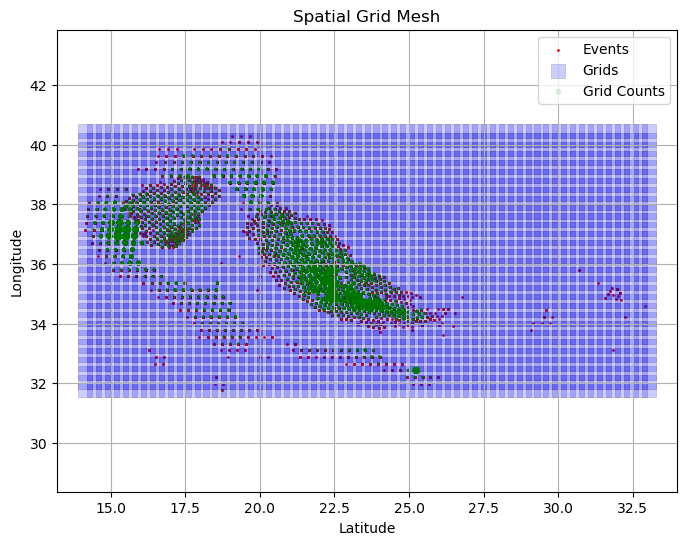

In [7]:
#plot grid counts and grid id
plt.figure(figsize=(8, 6))
plt.scatter(combined['lon'], combined['lat'], color='red', label='Events',s=1)
plt.scatter(mesh_lon,mesh_lat, color='blue', alpha=0.2, label='Grids', s=90, marker='s',linewidth =0.5, edgecolors='black')
plt.scatter(combined['lon'], combined['lat'], s=combined['gridcount']*0.01, color='green', alpha=0.1, label='Grid Counts')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Spatial Grid Mesh')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

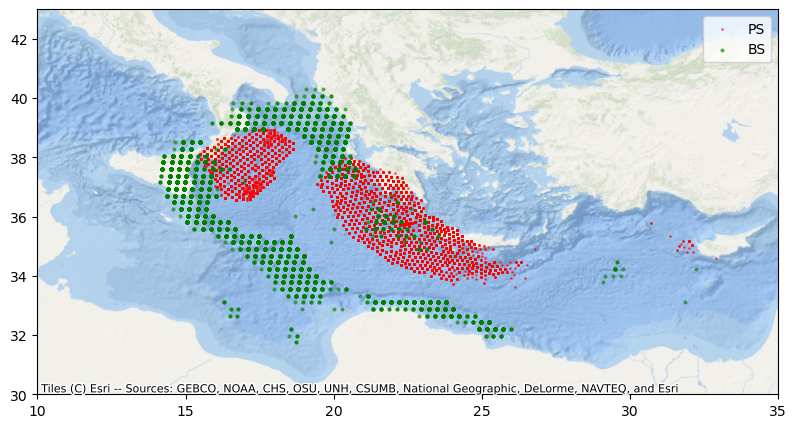

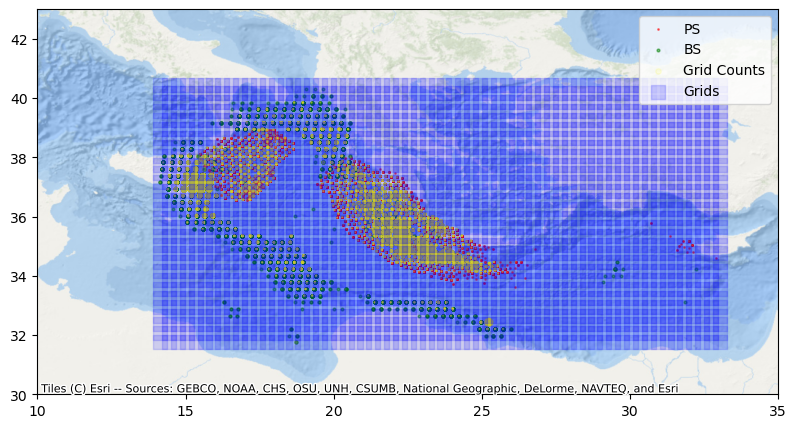

In [21]:
#plot location of events by event type
fig, ax = plt.subplots(figsize=(10,5))
#if BS or PS
ax = plt.scatter(combined[combined['id'].str[:2]=='PS']['lon'], combined[combined['id'].str[:2]=='PS']['lat'], alpha=0.5, label='PS',s=1,color='red')
ax = plt.scatter(combined[combined['id'].str[:2]=='BS']['lon'], combined[combined['id'].str[:2]=='BS']['lat'], alpha=0.5, label='BS', s=4,color='green')
# ax = plt.scatter(combined['lon'], combined['lat'], s=combined['gridcount']*0.01, color='yellow', alpha=0.1, label='Grid Counts')
# ax = plt.scatter(mesh_lon,mesh_lat, color='blue', alpha=0.2, label='Grids', s=50, marker='s',linewidth =0.5, edgecolors='blue')
plt.legend(loc='upper right')
plt.xlim(10, 35)
plt.ylim(30, 43)
ax = plt.gca()
cx.add_basemap(ax,crs='EPSG:4326', source=cx.providers.Esri.OceanBasemap)
plt.show()
#plot location of events by event type
fig, ax = plt.subplots(figsize=(10,5))
#if BS or PS
ax = plt.scatter(combined[combined['id'].str[:2]=='PS']['lon'], combined[combined['id'].str[:2]=='PS']['lat'], alpha=0.5, label='PS',s=1,color='red')
ax = plt.scatter(combined[combined['id'].str[:2]=='BS']['lon'], combined[combined['id'].str[:2]=='BS']['lat'], alpha=0.5, label='BS', s=4,color='green')
ax = plt.scatter(combined['lon'], combined['lat'], s=combined['gridcount']*0.015, color='yellow', alpha=0.1, label='Grid Counts')
ax = plt.scatter(mesh_lon,mesh_lat, color='blue', alpha=0.15, label='Grids', s=90, marker='s',linewidth =1, edgecolors='blue')
plt.legend(loc='upper right')
plt.xlim(10, 35)
plt.ylim(30, 43)
ax = plt.gca()
cx.add_basemap(ax,crs='EPSG:4326', source=cx.providers.Esri.OceanBasemap)
plt.show()

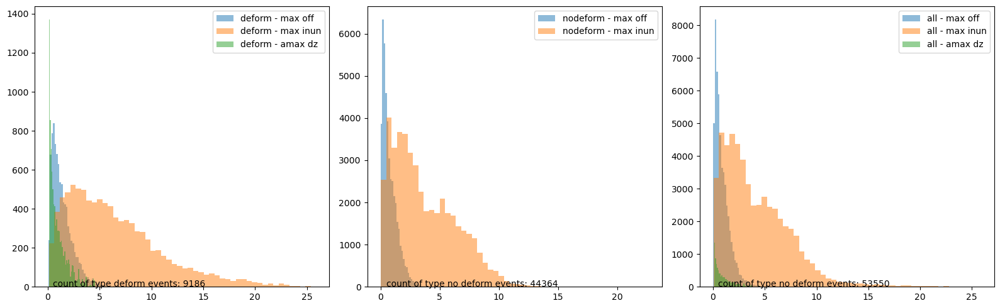

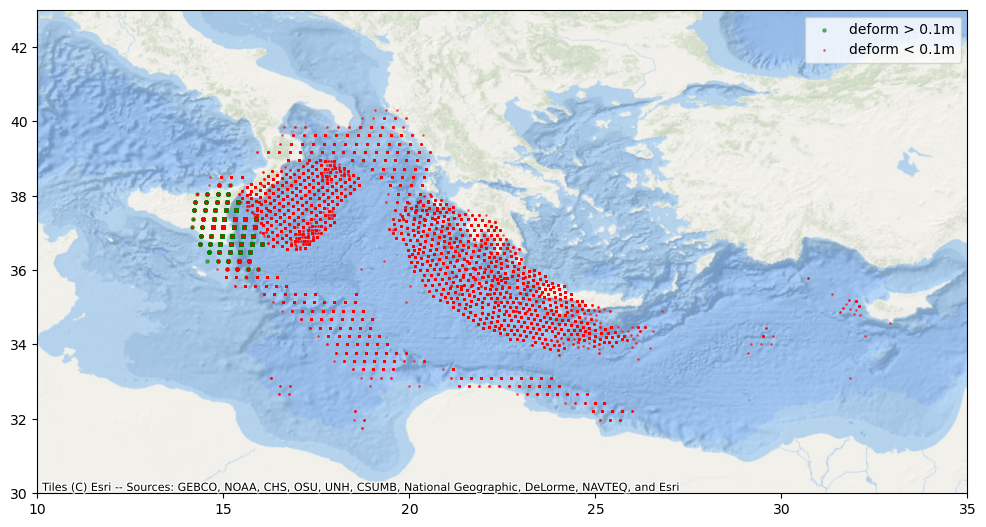

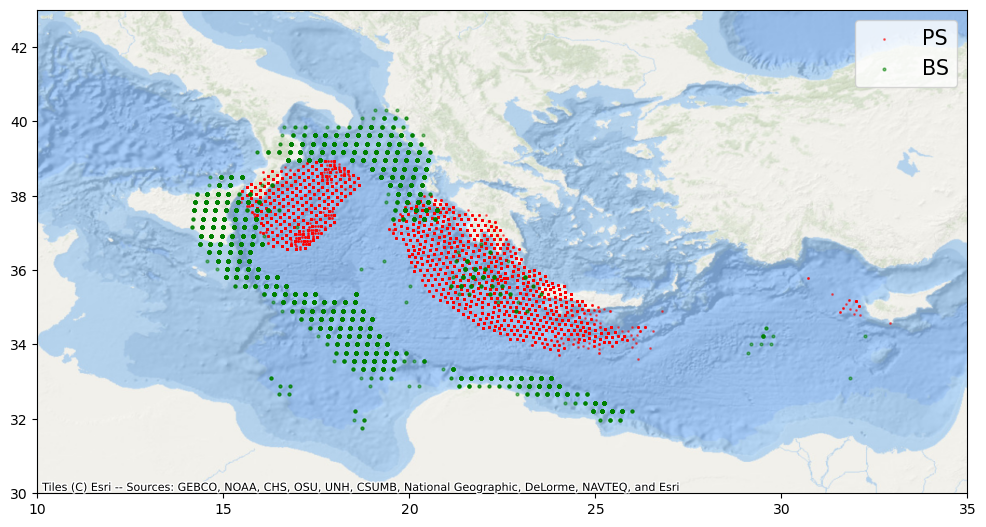

In [9]:
#distribution of events
fig, axs = plt.subplots(1, 3, tight_layout=True, figsize=(16,5))
axs[0].hist(combined[combined['event_type']==0]['max_off'], bins=50, alpha=0.5, label='deform - max off')
axs[0].hist(combined[combined['event_type']==0]['dmax'], bins=50, alpha=0.5, label='deform - max inun')
axs[0].hist(combined[combined['event_type']==0]['max_absdz'], bins=50, alpha=0.5, label='deform - amax dz')
axs[0].text(0.5, 2, 'count of type deform events: '+str(len(combined[combined['event_type']==0])))
axs[0].legend(loc='upper right')

axs[1].hist(combined[combined['event_type']==1]['max_off'], bins=50, alpha=0.5, label='nodeform - max off')
axs[1].hist(combined[combined['event_type']==1]['dmax'], bins=50, alpha=0.5, label='nodeform - max inun')
# axs[0,1].hist(combined[combined['event_type']==1]['max_absdz'], bins=50, alpha=0.5, label='nodeform - amax dz')
axs[1].text(0.5, 2, 'count of type no deform events: '+str(len(combined[combined['event_type']==1])))
axs[1].legend(loc='upper right')

# axs[1,0].hist(combined[combined['event_type']==0]['importance'], bins=50, alpha=0.5, label='deform - importance')
# axs[1,0].hist(combined[combined['event_type']==1]['importance'], bins=50, alpha=0.5, label='nodeform - importance')
# axs[1,0].legend(loc='upper right')

axs[2].hist(combined['max_off'], bins=50, alpha=0.5, label='all - max off')
axs[2].hist(combined['dmax'], bins=50, alpha=0.5, label='all - max inun')
axs[2].hist(combined[combined['max_absdz']>0.1]['max_absdz'], bins=50, alpha=0.5, label='all - amax dz')
axs[2].text(0.5, 2, 'count of type no deform events: '+str(len(combined)))
axs[2].legend(loc='upper right')

#plot location of events by event type
fig, ax = plt.subplots(figsize=(12,10))
ax = plt.scatter(combined[combined['event_type']==0]['lon'], combined[combined['event_type']==0]['lat'], alpha=0.5, label='deform > 0.1m', s=5,color='green')
ax = plt.scatter(combined[combined['event_type']==1]['lon'], combined[combined['event_type']==1]['lat'], alpha=0.5, label='deform < 0.1m',s=1,color='red')
plt.legend(loc='upper right')
plt.xlim(10, 35)
plt.ylim(30, 43)
ax = plt.gca()
cx.add_basemap(ax,crs='EPSG:4326', source=cx.providers.Esri.OceanBasemap)

#plot location of events by event type
fig, ax = plt.subplots(figsize=(12,10))
#if BS or PS
ax = plt.scatter(combined[combined['id'].str[:2]=='PS']['lon'], combined[combined['id'].str[:2]=='PS']['lat'], alpha=0.5, label='PS',s=1,color='red')
ax = plt.scatter(combined[combined['id'].str[:2]=='BS']['lon'], combined[combined['id'].str[:2]=='BS']['lat'], alpha=0.5, label='BS', s=4,color='green')
plt.legend(loc='upper right',fontsize=15)
plt.xlim(10, 35)
plt.ylim(30, 43)
ax = plt.gca()
cx.add_basemap(ax,crs='EPSG:4326', source=cx.providers.Esri.OceanBasemap)
plt.show()

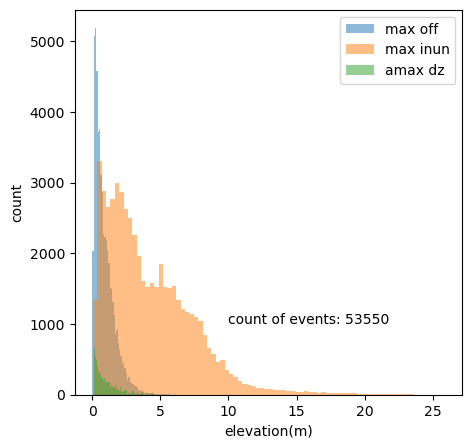

In [10]:
fig, axs = plt.subplots(1, 1, figsize=(5, 5))
axs.hist(combined['max_off'], bins=80, alpha=0.5, label='max off')
axs.hist(combined['dmax'], bins=80, alpha=0.5, label='max inun')
axs.hist(combined[combined['max_absdz']>0.1]['max_absdz'], bins=80, alpha=0.5, label='amax dz')
axs.text(10, 1000, 'count of events: '+str(len(combined)))
axs.legend(loc='upper right')
#label axes
axs.set(xlabel='elevation(m)', ylabel='count')
plt.savefig(MLDir + f'/resources/plots/dist_events{str(len(combined))}_{reg}_{columnname}.png', bbox_inches='tight')


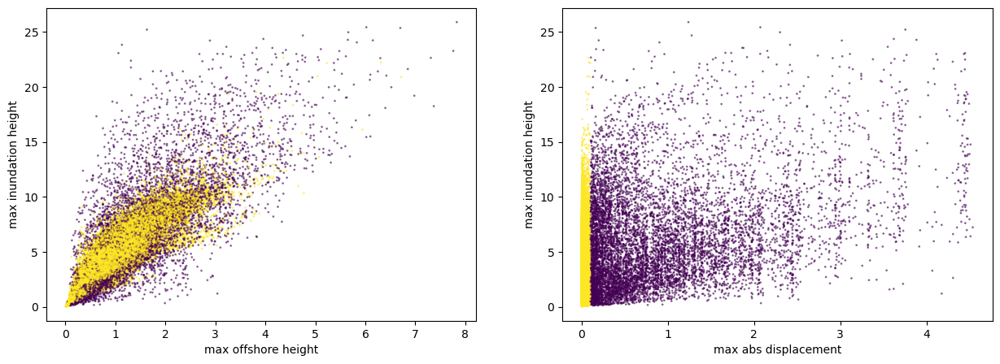

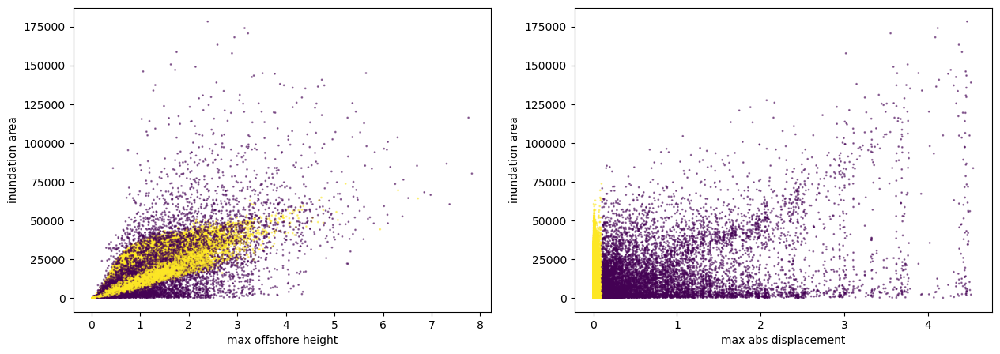

In [11]:
#plt relationship between max_off and dmax
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].scatter(combined['max_off'], combined['dmax'], alpha=0.5,s=1, c=combined['event_type'])
axs[1].scatter(combined['max_absdz'], combined['dmax'], alpha=0.5,s=1, c=combined['event_type'])
#set labels
axs[0].set(xlabel='max offshore height', ylabel='max inundation height')
axs[1].set(xlabel='max abs displacement', ylabel='max inundation height')
plt.show()

#plt relationship between max_off and dmax
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].scatter(combined['max_off'], combined['count'], alpha=0.5,s=1, c=combined['event_type'])
axs[1].scatter(combined['max_absdz'], combined['count'], alpha=0.5,s=1, c=combined['event_type'])
#set labels
axs[0].set(xlabel='max offshore height', ylabel='inundation area')
axs[1].set(xlabel='max abs displacement', ylabel='inundation area')
plt.show()

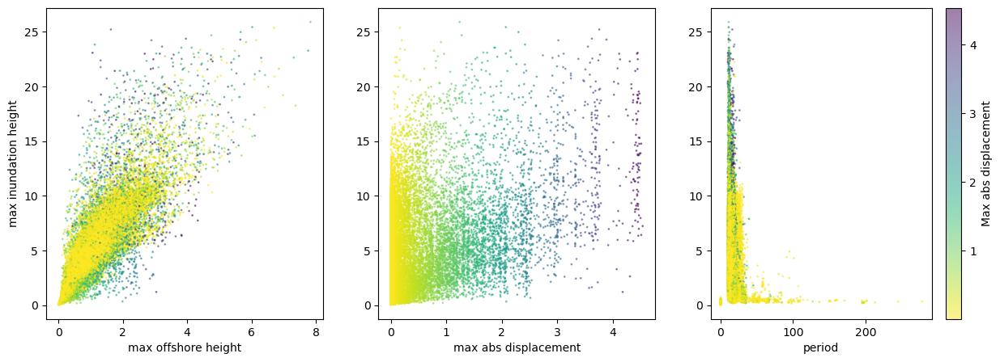

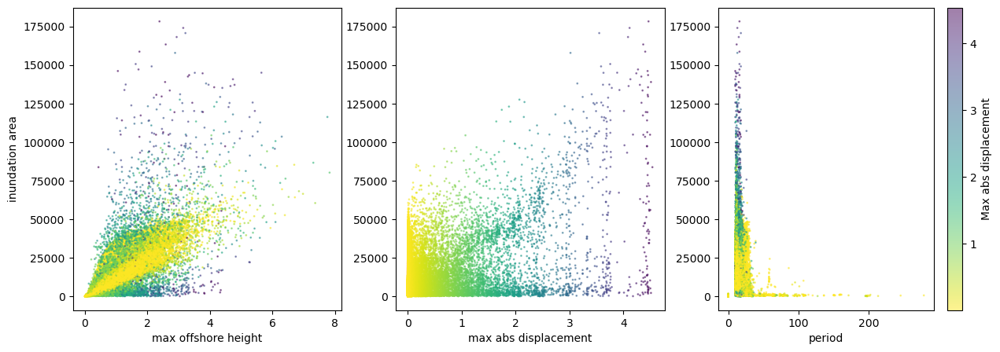

In [12]:
cmap = plt.cm.viridis.reversed()

#plt relationship between max_off and dmax
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
sc=axs[0].scatter(combined['max_off'], combined['dmax'], alpha=0.5,s=1, c=combined['max_absdz'],cmap = cmap)
axs[1].scatter(combined['max_absdz'], combined['dmax'], alpha=0.5,s=1, c=combined['max_absdz'],cmap = cmap)
axs[2].scatter(combined['wave_period'], combined['dmax'], alpha=0.5,s=1, c=combined['max_absdz'],cmap = cmap)
#set labels
axs[0].set(xlabel='max offshore height', ylabel='max inundation height')
axs[1].set(xlabel='max abs displacement')
axs[2].set(xlabel='period')
# Add colorbar
cbar = plt.colorbar(sc, ax=axs[2])
cbar.set_label('Max abs displacement')
plt.show()

#plt relationship between max_off and dmax
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
sc=axs[0].scatter(combined['max_off'], combined['count'], alpha=0.5,s=1, c=combined['max_absdz'],cmap = cmap)
axs[1].scatter(combined['max_absdz'], combined['count'], alpha=0.5,s=1, c=combined['max_absdz'],cmap = cmap)
axs[2].scatter(combined['wave_period'], combined['count'], alpha=0.5,s=1, c=combined['max_absdz'],cmap = cmap)
#set labels
axs[0].set(xlabel='max offshore height', ylabel='inundation area')
axs[1].set(xlabel='max abs displacement')
axs[2].set(xlabel='period')
# Add colorbar
cbar = plt.colorbar(sc, ax=axs[2])
cbar.set_label('Max abs displacement')
# plt.show()

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import contextily as cx
import os

np.random.seed(0)

def sample_train_events(data, #input dataframe with event info 
                        importance_column='mean_prob', #column name for importance weighted sampling
                        samples_per_bin=10, #no of events to sample per bin
                        bin_def = [0,0.5,1.0,1.5,2.0,2.5,3.0,3.5,4.0,5.0], #bin width for wave height,
                        basis_var='max_off' #variable to bin 
                        ): 

    #define bin edges
    bin_start = bin_def[:-1]
    bin_end = bin_def[1:]

    if np.any((data['mean_prob'] < 0) | (data[importance_column] < 0)):
        raise ValueError('event_rates and importance parameter must be nonnegative')
    
    sample = []
    for bin in list(zip(bin_start, bin_end)):
       
        #get events in this bin
        events_in_bin = data[(data[basis_var] >= bin[0]) & (data[basis_var] < bin[1])]
        print('Sampling',samples_per_bin, 'events in bin',bin,'from',len(events_in_bin),'events')
        
        rate_with_this_bin = np.sum(events_in_bin['mean_prob'] )    
        events_in_bin_copy = events_in_bin.copy()

        #sort by lat and lon
        events_in_bin_copy.sort_values(by=['lat', 'lon'], inplace=True)

        if importance_column == 'gridcount' or importance_column == 'LocationCount':
            # Print count of events per grid and print grid ID with the minimum count
            grid_counts = events_in_bin_copy.groupby('grid_id').count()['id']
            # Add the weights column
            events_in_bin_copy['norm_wt'] = events_in_bin_copy['grid_id'].map(lambda x: 1 / grid_counts[x])
            events_in_bin_copy['norm_wt'] /= np.sum(events_in_bin_copy['norm_wt'])      
        else:
            events_in_bin_copy.loc[:, 'norm_wt'] = events_in_bin[importance_column] / np.sum(events_in_bin[importance_column])  

        if samples_per_bin > 0 and np.sum(events_in_bin_copy['norm_wt']) > 0:
            #sample events from this bin weighted by norm_wt
            if len(events_in_bin) <= samples_per_bin:
                print('Less scenarios(',len(events_in_bin),') to sample in this bin',bin,' -- need to be careful using samples will use sample with replacement')
                sampled_ids = np.random.choice(events_in_bin['id'],
                                                size=len(events_in_bin),
                                                p=events_in_bin_copy['norm_wt'],
                                                replace=False,
                                                )
            else:
                sampled_ids = np.random.choice(events_in_bin['id'],
                                                size=samples_per_bin,
                                                p=events_in_bin_copy['norm_wt'],
                                                replace=False,
                                                )            
        #get the sampled events
        sample.append(pd.DataFrame({
            'id': sampled_ids,
            'bin_start': np.repeat(bin[0], len(sampled_ids)),
            'bin_end': np.repeat(bin[1], len(sampled_ids)),
            'rate_with_this_bin': np.repeat(rate_with_this_bin, len(sampled_ids))
        }))
    
    return sample


In [2]:
#select particular representative gauge
reg = 'SR'

if reg == 'SR':
    columnname = str(54)
elif reg == 'CT':
    columnname = str(38)

#read combined dataframe
combined = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/info/sampling_input_{reg}_{columnname}.csv')

# far = combined.groupby('event_type').get_group(1)
# near = combined.groupby('event_type').get_group(0)
MLDir = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami' 

In [3]:
# #get data to sample
deform_combine = combined.groupby('event_type').get_group(0)
combined_half_deform = deform_combine.sample(frac=0.5, random_state=0).reset_index(drop=True)
nodeform_combine = combined.groupby('event_type').get_group(1)
combined_half_nodeform = nodeform_combine.sample(frac=0.5, random_state=0).reset_index(drop=True)
#split id first 2 characters to get BS or PS
combined_half_nodeform['source_type'] = combined_half_nodeform['id'].str[:2]

#'split sampling in two steps for event type 0 and 1 then merge'
wt_para = 'gridcount' #'LocationCount', 'mean_prob', 'importance', 'uniform', gridcount


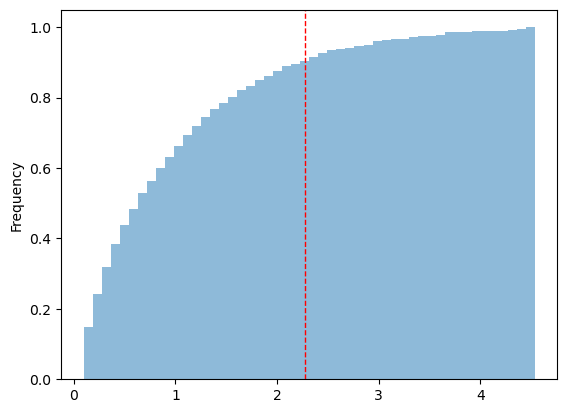

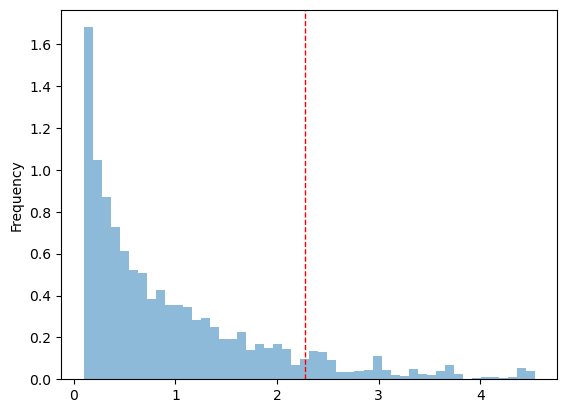

count above 90th percentile 918
total count 9186


In [6]:
'plot the distribution of the variable to sample'
var2plot = 'max_absdz'
#plot cdf of variable to sample
deform_combine[var2plot].plot.hist(bins=50, alpha=0.5, label='deform',cumulative=True, density=True)
plt.axvline(deform_combine[var2plot].quantile(0.9), color='red', linestyle='dashed', linewidth=1)
plt.show()
deform_combine[var2plot].plot.hist(bins=50, alpha=0.5, label='deform',density=True)
plt.axvline(deform_combine[var2plot].quantile(0.9), color='red', linestyle='dashed', linewidth=1)
plt.show()
print('count above 90th percentile',len(deform_combine[deform_combine[var2plot]>deform_combine[var2plot].quantile(0.9)]))
print('total count',len(deform_combine))

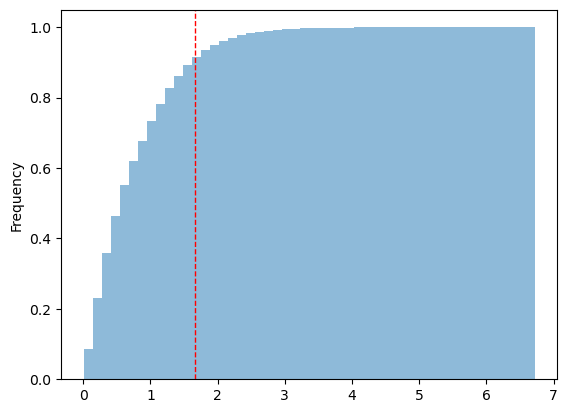

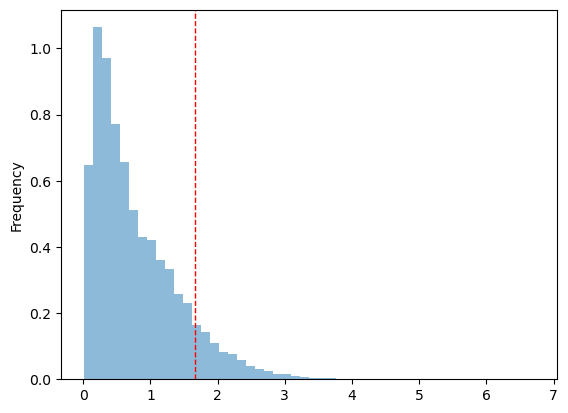

count above 90th percentile 4417
total count 44364


In [7]:
'plot the distribution of the variable to sample'
var2plot = 'max_off'
#plot cdf of variable to sample
nodeform_combine[var2plot].plot.hist(bins=50, alpha=0.5, label='deform',cumulative=True, density=True)
plt.axvline(nodeform_combine[var2plot].quantile(0.9), color='red', linestyle='dashed', linewidth=1)
plt.show()
nodeform_combine[var2plot].plot.hist(bins=50, alpha=0.5, label='deform',density=True)
plt.axvline(nodeform_combine[var2plot].quantile(0.9), color='red', linestyle='dashed', linewidth=1)
plt.show()
print('count above 90th percentile',len(nodeform_combine[nodeform_combine[var2plot]>nodeform_combine[var2plot].quantile(0.9)]))
print('total count',len(nodeform_combine))

In [8]:
#use all for deformation pretraining
deform_combine['id'].to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/sample_events{str(len(deform_combine))}_{reg}_{columnname}.txt', header=False, index=None)

In [4]:
start = 0.1

thresh_deform = combined_half_deform['max_absdz'].quantile(0.9)
max_deform = combined_half_deform['max_absdz'].max()
total_deform = len(combined_half_deform)    

thresh_deform_off = combined_half_deform['max_off'].quantile(0.9)
max_deform_off = combined_half_deform['max_off'].max()

temp = combined_half_nodeform.groupby('source_type').get_group('BS')
thresh_BS_off = temp['max_off'].quantile(0.9)
max_BS_off = temp['max_off'].max()
total_BS_off = len(temp)
del temp

temp = combined_half_nodeform.groupby('source_type').get_group('PS')
thresh_PS_off = temp['max_off'].quantile(0.9)
max_PS_off = temp['max_off'].max()
total_PS_off = len(temp)
del temp

#total and count above threshold
count_deform = len(combined_half_deform[combined_half_deform['max_absdz']>thresh_deform])
count_def_off = len(combined_half_deform[combined_half_deform['max_off']>thresh_deform_off])


thresh_deform 2.2764000000000006 max_deform 4.5
bin_def [ 0.1         0.34182222  0.58364444  0.82546667  1.06728889  1.30911111
  1.55093333  1.79275556  2.03457778  2.2764      2.2764      2.52346667
  2.77053333  3.0176      3.26466667  3.51173333  3.7588      4.00586667
  4.25293333  4.5        99.        ] count 21
Sampling 2 events in bin (0.1, 0.34182222222222225) from 1384 events
Sampling 2 events in bin (0.34182222222222225, 0.5836444444444445) from 768 events
Sampling 2 events in bin (0.5836444444444445, 0.8254666666666668) from 506 events
Sampling 2 events in bin (0.8254666666666668, 1.0672888888888892) from 417 events
Sampling 2 events in bin (1.0672888888888892, 1.3091111111111116) from 329 events
Sampling 2 events in bin (1.3091111111111116, 1.5509333333333337) from 255 events
Sampling 2 events in bin (1.5509333333333337, 1.7927555555555559) from 189 events
Sampling 2 events in bin (1.7927555555555559, 2.0345777777777783) from 176 events
Sampling 2 events in bin (2.034577

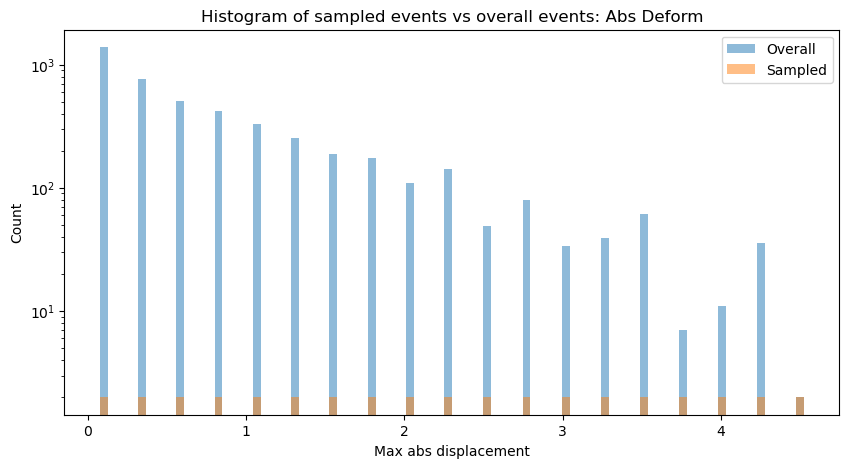

Unique sampled events: 38
thresh_deform_off 2.8 max_deform_off 6.25
bin_def [ 0.1         0.4         0.7         1.          1.3         1.6
  1.9         2.2         2.5         2.8         2.8         3.18333333
  3.56666667  3.95        4.33333333  4.71666667  5.1         5.48333333
  5.86666667  6.25       99.        ] count 21
Sampling 2 events in bin (0.1, 0.4) from 596 events
Sampling 2 events in bin (0.4, 0.7) from 789 events
Sampling 2 events in bin (0.7, 0.9999999999999999) from 644 events
Sampling 2 events in bin (0.9999999999999999, 1.3) from 586 events
Sampling 2 events in bin (1.3, 1.6) from 437 events
Sampling 2 events in bin (1.6, 1.9) from 381 events
Sampling 2 events in bin (1.9, 2.2) from 285 events
Sampling 2 events in bin (2.2, 2.5) from 224 events
Sampling 2 events in bin (2.5, 2.8) from 167 events
Sampling 2 events in bin (2.8, 2.8) from 0 events
Sampling 2 events in bin (2.8, 3.183333333333333) from 168 events
Sampling 2 events in bin (3.183333333333333, 3.5666

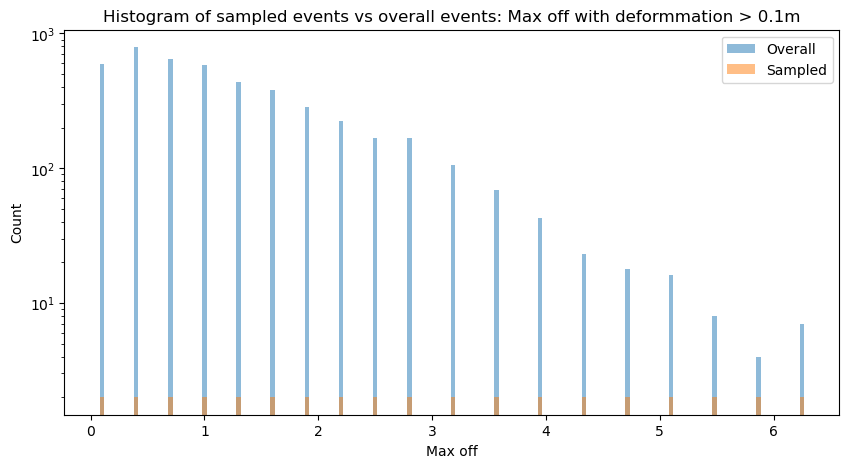

Unique sampled events: 38
thresh_BS_off 1.58 max_BS_off 4.25
bin_def [ 0.1         0.26444444  0.42888889  0.59333333  0.75777778  0.92222222
  1.08666667  1.25111111  1.41555556  1.58        1.58        1.87666667
  2.17333333  2.47        2.76666667  3.06333333  3.36        3.65666667
  3.95333333  4.25       99.        ] count 21
Sampling 2 events in bin (0.1, 0.2644444444444445) from 1294 events
Sampling 2 events in bin (0.2644444444444445, 0.4288888888888889) from 1359 events
Sampling 2 events in bin (0.4288888888888889, 0.5933333333333334) from 1199 events
Sampling 2 events in bin (0.5933333333333334, 0.7577777777777778) from 822 events
Sampling 2 events in bin (0.7577777777777778, 0.9222222222222222) from 732 events
Sampling 2 events in bin (0.9222222222222222, 1.0866666666666667) from 536 events
Sampling 2 events in bin (1.0866666666666667, 1.2511111111111113) from 446 events
Sampling 2 events in bin (1.2511111111111113, 1.4155555555555557) from 313 events
Sampling 2 events in 

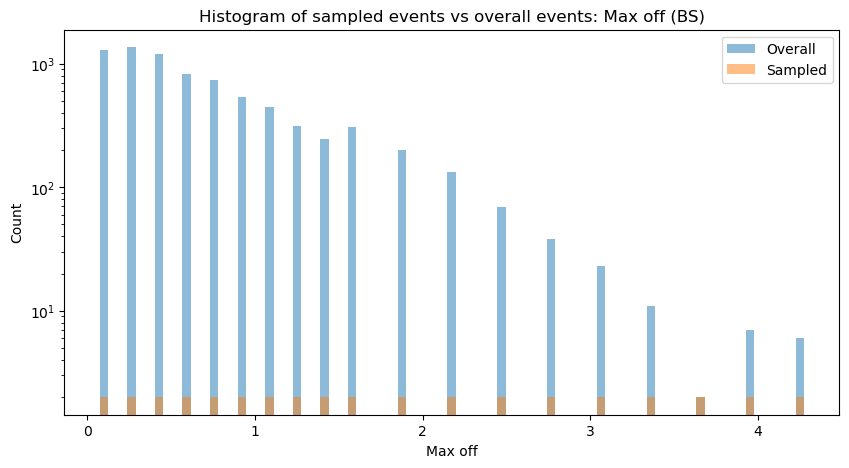

Unique sampled events: 38
thresh_PS_off 1.7 max_PS_off 3.6
bin_def [ 0.1         0.27777778  0.45555556  0.63333333  0.81111111  0.98888889
  1.16666667  1.34444444  1.52222222  1.7         1.7         1.91111111
  2.12222222  2.33333333  2.54444444  2.75555556  2.96666667  3.17777778
  3.38888889  3.6        99.        ] count 21
Sampling 6 events in bin (0.1, 0.2777777777777778) from 2892 events
Sampling 6 events in bin (0.2777777777777778, 0.4555555555555555) from 2127 events
Sampling 6 events in bin (0.4555555555555555, 0.6333333333333332) from 1752 events
Sampling 6 events in bin (0.6333333333333332, 0.811111111111111) from 1230 events
Sampling 6 events in bin (0.811111111111111, 0.9888888888888888) from 1008 events
Sampling 6 events in bin (0.9888888888888888, 1.1666666666666665) from 1048 events
Sampling 6 events in bin (1.1666666666666665, 1.3444444444444443) from 909 events
Sampling 6 events in bin (1.3444444444444443, 1.5222222222222221) from 713 events
Sampling 6 events in b

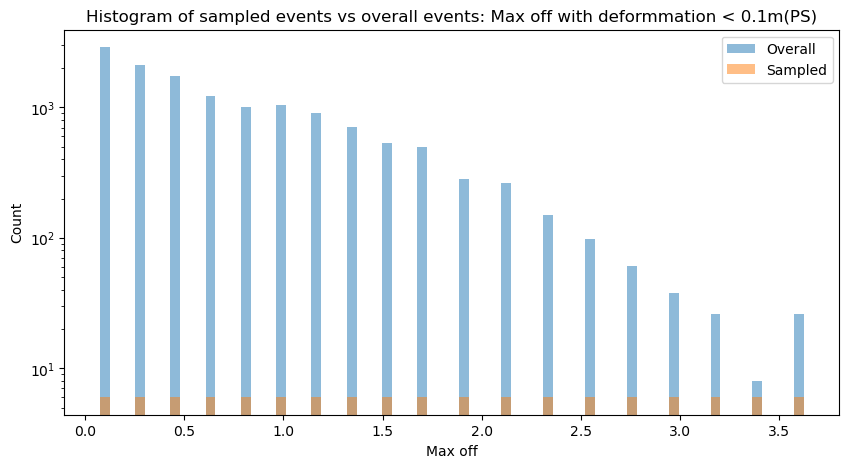

Unique sampled events: 114
test set size: 53322


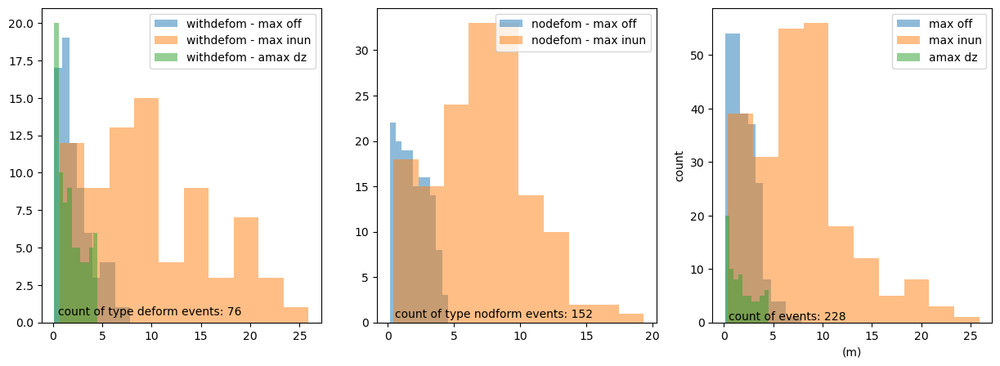

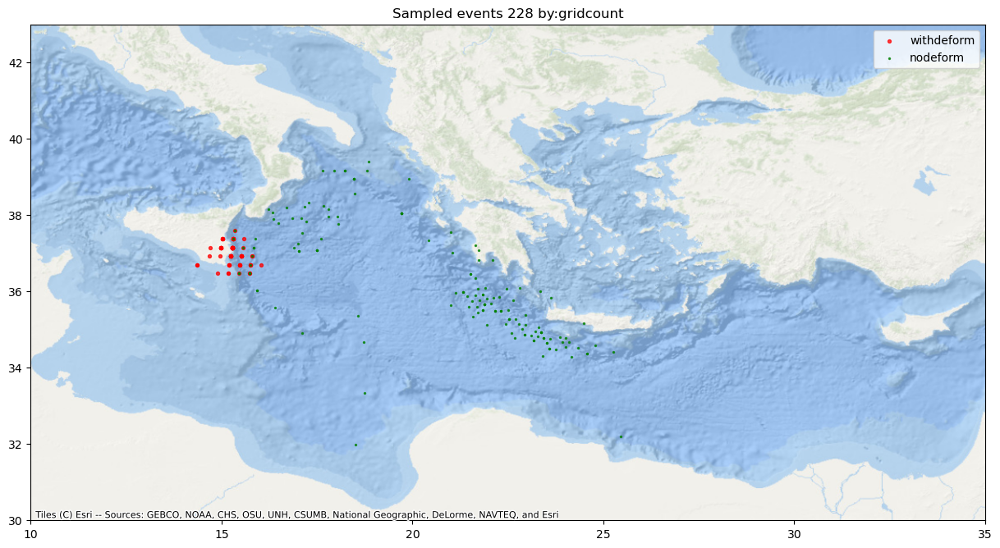

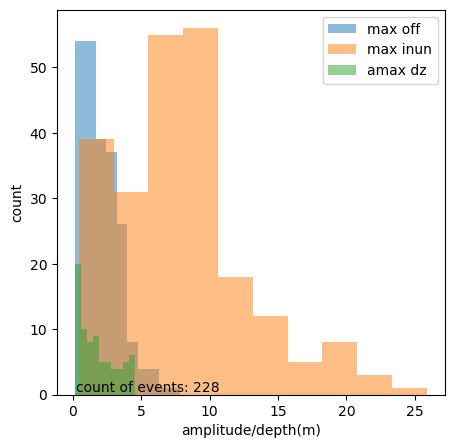

In [6]:
X = 1
#emphasis above a threshold(90%) 
max_deform = 4.5
samples_per_bin = 2 * X
bin_splits = 10

bin_def_1 =  np.linspace(start,thresh_deform,bin_splits)
bin_def_2 =  np.linspace(thresh_deform,max_deform, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform',thresh_deform,'max_deform',max_deform)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step0 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_absdz')
#set as dataframe
sample_step0 = pd.concat(sample_step0, axis=0)

#update other parameters from combined
sample_step0 = pd.merge(sample_step0, combined, on='id', how='left')

#keep only unique events
sample_step0 = sample_step0.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_absdz'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step0['max_absdz'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max abs displacement', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Abs Deform')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step0['id'].unique()))

#override max_deform_off
max_deform_off = 6.25

bin_def_1 =  np.linspace(start,thresh_deform_off,bin_splits)
bin_def_2 =  np.linspace(thresh_deform_off,max_deform_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform_off',thresh_deform_off,'max_deform_off',max_deform_off)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step1 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')
#set as dataframe
sample_step1 = pd.concat(sample_step1, axis=0)
#update other parameters from combined
sample_step1 = pd.merge(sample_step1, combined, on='id', how='left')
#keep only unique events
sample_step1 = sample_step1.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step1['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.04,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.04, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation > 0.1m')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step1['id'].unique()))

#override max_off
max_BS_off = 4.25

bin_def_1 =  np.linspace(start,thresh_BS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_BS_off,max_BS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_BS_off',thresh_BS_off,'max_BS_off',max_BS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step3 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('BS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step3 = pd.concat(sample_step3, axis=0)
#update other parameters from combined
sample_step3 = pd.merge(sample_step3, combined, on='id', how='left')
#keep only unique events
sample_step3 = sample_step3.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('BS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step3['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off (BS)')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step3['id'].unique()))

#override max
samples_per_bin = samples_per_bin *3
max_PS_off = 3.6

bin_def_1 =  np.linspace(start,thresh_PS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_PS_off,max_PS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_PS_off',thresh_PS_off,'max_PS_off',max_PS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step2 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('PS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step2 = pd.concat(sample_step2, axis=0)
#update other parameters from combined
sample_step2 = pd.merge(sample_step2, combined, on='id', how='left')
#keep only unique events
sample_step2 = sample_step2.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('PS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step2['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation < 0.1m(PS)')
plt.legend()
plt.show()

print('Unique sampled events:',len(sample_step2['id'].unique()))
#merge samples to get final sample
sample_test = pd.concat([sample_step0,sample_step1,sample_step2,sample_step3], axis=0)
#keep only unique events
sample_test = sample_test.drop_duplicates(subset=['id'])

#check if plot folder exists
if not os.path.exists(MLDir + f'/model/{reg}/plot'):
    os.makedirs(MLDir + f'/model/{reg}/plot')


#plot 
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].hist(sample_test[sample_test['event_type']==0]['max_off'], bins=bin_splits, alpha=0.5, label='withdefom - max off')
axs[0].hist(sample_test[sample_test['event_type']==0]['dmax'], bins=bin_splits, alpha=0.5, label='withdefom - max inun')
axs[0].hist(sample_test[sample_test['event_type']==0]['max_absdz'], bins=bin_splits, alpha=0.5, label='withdefom - amax dz')
axs[0].text(0.5, 0.5, 'count of type deform events: '+str(len(sample_test[sample_test['event_type']==0])))
axs[0].legend(loc='upper right')

axs[1].hist(sample_test[sample_test['event_type']==1]['max_off'], bins=bin_splits, alpha=0.5, label='nodefom - max off')
axs[1].hist(sample_test[sample_test['event_type']==1]['dmax'], bins=bin_splits, alpha=0.5, label='nodefom - max inun')
axs[1].text(0.5, 0.5,'count of type nodform events: '+str(len(sample_test[sample_test['event_type']==1])))
axs[1].legend(loc='upper right')

axs[2].hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs[2].hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs[2].hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs[2].text(0.5, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs[2].legend(loc='upper right')
#label axes
axs[2].set(xlabel='(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events_splits{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, ax = plt.subplots(figsize=(15,10))
ax.title.set_text('Sampled events ' + str(len(sample_test)) + ' by:' + wt_para)
ax = plt.scatter(sample_test[sample_test['event_type']==0]['lon'], sample_test[sample_test['event_type']==0]['lat'], alpha=0.75, label='withdeform',s=8, color='red')
ax = plt.scatter(sample_test[sample_test['event_type']==1]['lon'], sample_test[sample_test['event_type']==1]['lat'], alpha=0.75, label='nodeform', s=2, color='green')
plt.legend(loc='upper right')
plt.xlim(10, 35)
plt.ylim(30, 43)
ax = plt.gca()
cx.add_basemap(ax,crs='EPSG:4326', source=cx.providers.Esri.OceanBasemap)
plt.savefig(MLDir + f'/model/{reg}/plot/samplemap_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, axs = plt.subplots(1, 1, figsize=(5, 5))
axs.hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs.hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs.hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs.text(0.25, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs.legend(loc='upper right')
#label axes
axs.set(xlabel='amplitude/depth(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

#save list of ids to txt file for training
#for building model
sample_test['id'].to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/sample_events{str(len(sample_test))}_{reg}_{columnname}.txt', header=False, index=None)

#evaluation of model by removing sample from combined ie the test set
test = combined[~combined['id'].isin(sample_test['id'])]
len_test = len(test['id'].unique())
print('test set size:',len_test)
pd.DataFrame(test['id'].unique()).to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_test_{reg}_{str(len_test)}_{str(len(sample_test))}.txt', header=False, index=None)


thresh_deform 2.2764000000000006 max_deform 4.5
bin_def [ 0.1         0.34182222  0.58364444  0.82546667  1.06728889  1.30911111
  1.55093333  1.79275556  2.03457778  2.2764      2.2764      2.52346667
  2.77053333  3.0176      3.26466667  3.51173333  3.7588      4.00586667
  4.25293333  4.5        99.        ] count 21
Sampling 5 events in bin (0.1, 0.34182222222222225) from 1384 events
Sampling 5 events in bin (0.34182222222222225, 0.5836444444444445) from 768 events
Sampling 5 events in bin (0.5836444444444445, 0.8254666666666668) from 506 events
Sampling 5 events in bin (0.8254666666666668, 1.0672888888888892) from 417 events
Sampling 5 events in bin (1.0672888888888892, 1.3091111111111116) from 329 events
Sampling 5 events in bin (1.3091111111111116, 1.5509333333333337) from 255 events
Sampling 5 events in bin (1.5509333333333337, 1.7927555555555559) from 189 events
Sampling 5 events in bin (1.7927555555555559, 2.0345777777777783) from 176 events
Sampling 5 events in bin (2.034577

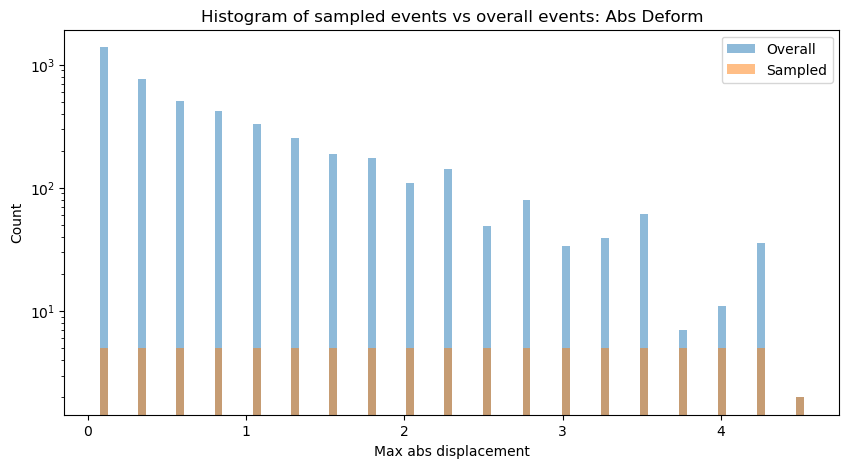

Unique sampled events: 92
thresh_deform_off 2.8 max_deform_off 6.25
bin_def [ 0.1         0.4         0.7         1.          1.3         1.6
  1.9         2.2         2.5         2.8         2.8         3.18333333
  3.56666667  3.95        4.33333333  4.71666667  5.1         5.48333333
  5.86666667  6.25       99.        ] count 21
Sampling 5 events in bin (0.1, 0.4) from 596 events
Sampling 5 events in bin (0.4, 0.7) from 789 events
Sampling 5 events in bin (0.7, 0.9999999999999999) from 644 events
Sampling 5 events in bin (0.9999999999999999, 1.3) from 586 events
Sampling 5 events in bin (1.3, 1.6) from 437 events
Sampling 5 events in bin (1.6, 1.9) from 381 events
Sampling 5 events in bin (1.9, 2.2) from 285 events
Sampling 5 events in bin (2.2, 2.5) from 224 events
Sampling 5 events in bin (2.5, 2.8) from 167 events
Sampling 5 events in bin (2.8, 2.8) from 0 events
Sampling 5 events in bin (2.8, 3.183333333333333) from 168 events
Sampling 5 events in bin (3.183333333333333, 3.5666

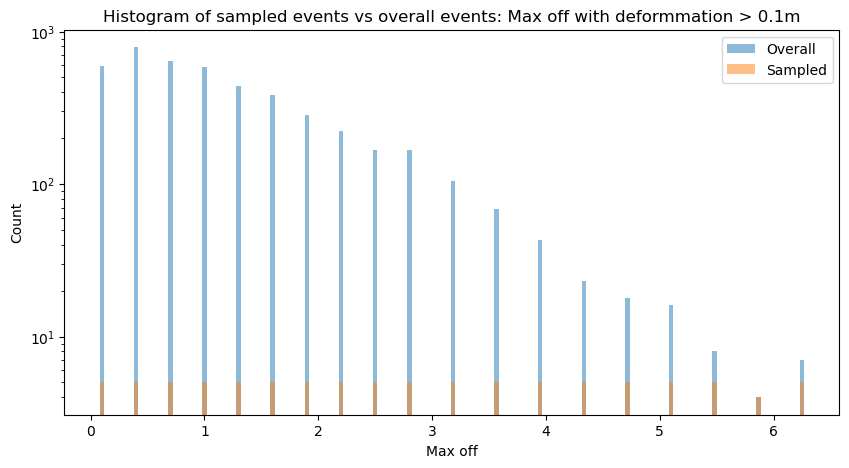

Unique sampled events: 94
thresh_BS_off 1.58 max_BS_off 4.25
bin_def [ 0.1         0.26444444  0.42888889  0.59333333  0.75777778  0.92222222
  1.08666667  1.25111111  1.41555556  1.58        1.58        1.87666667
  2.17333333  2.47        2.76666667  3.06333333  3.36        3.65666667
  3.95333333  4.25       99.        ] count 21
Sampling 5 events in bin (0.1, 0.2644444444444445) from 1294 events
Sampling 5 events in bin (0.2644444444444445, 0.4288888888888889) from 1359 events
Sampling 5 events in bin (0.4288888888888889, 0.5933333333333334) from 1199 events
Sampling 5 events in bin (0.5933333333333334, 0.7577777777777778) from 822 events
Sampling 5 events in bin (0.7577777777777778, 0.9222222222222222) from 732 events
Sampling 5 events in bin (0.9222222222222222, 1.0866666666666667) from 536 events
Sampling 5 events in bin (1.0866666666666667, 1.2511111111111113) from 446 events
Sampling 5 events in bin (1.2511111111111113, 1.4155555555555557) from 313 events
Sampling 5 events in 

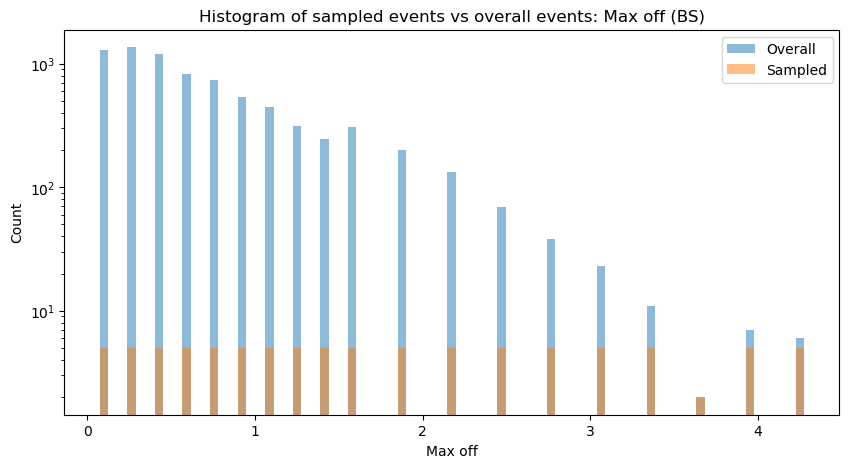

Unique sampled events: 92
thresh_PS_off 1.7 max_PS_off 3.6
bin_def [ 0.1         0.27777778  0.45555556  0.63333333  0.81111111  0.98888889
  1.16666667  1.34444444  1.52222222  1.7         1.7         1.91111111
  2.12222222  2.33333333  2.54444444  2.75555556  2.96666667  3.17777778
  3.38888889  3.6        99.        ] count 21
Sampling 15 events in bin (0.1, 0.2777777777777778) from 2892 events
Sampling 15 events in bin (0.2777777777777778, 0.4555555555555555) from 2127 events
Sampling 15 events in bin (0.4555555555555555, 0.6333333333333332) from 1752 events
Sampling 15 events in bin (0.6333333333333332, 0.811111111111111) from 1230 events
Sampling 15 events in bin (0.811111111111111, 0.9888888888888888) from 1008 events
Sampling 15 events in bin (0.9888888888888888, 1.1666666666666665) from 1048 events
Sampling 15 events in bin (1.1666666666666665, 1.3444444444444443) from 909 events
Sampling 15 events in bin (1.3444444444444443, 1.5222222222222221) from 713 events
Sampling 15 ev

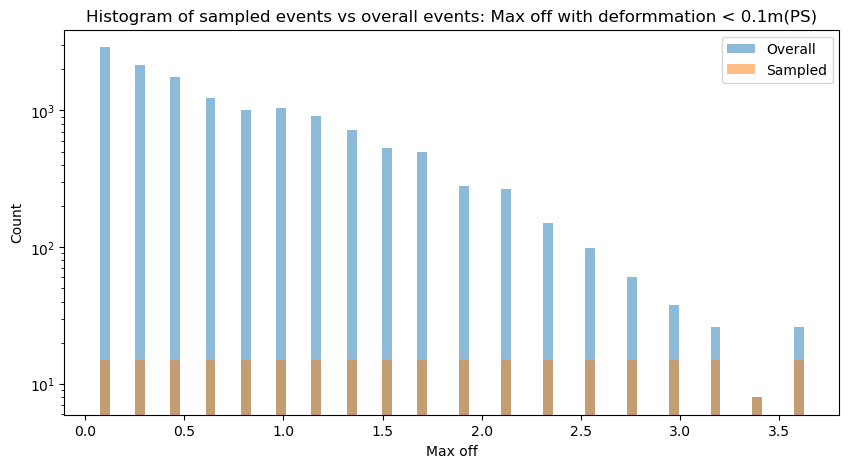

Unique sampled events: 278
test set size: 53000


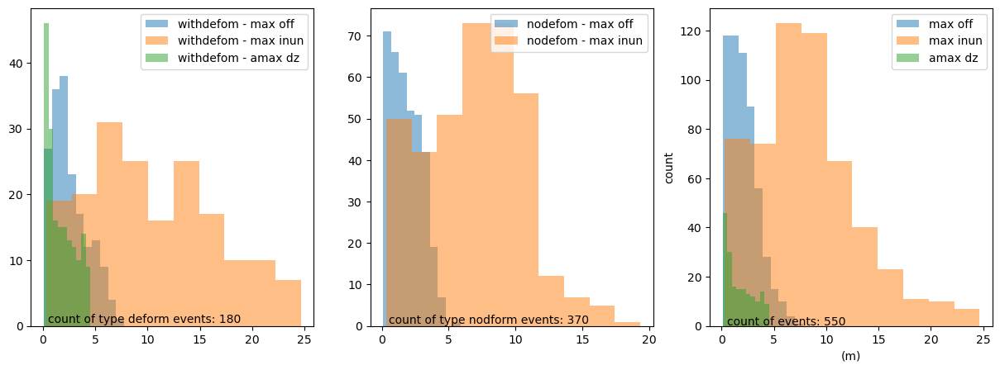

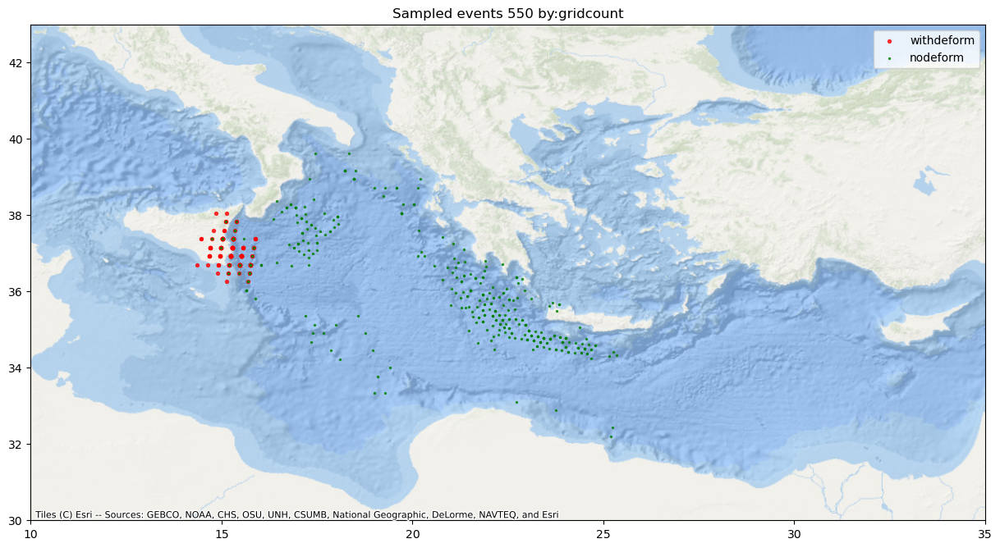

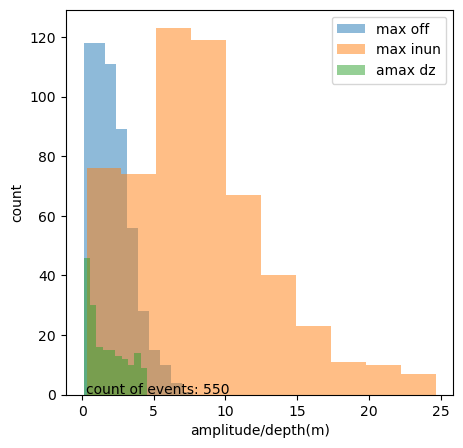

In [6]:
X = 1
#emphasis above a threshold(90%) 
max_deform = 4.5
samples_per_bin = 5 * X
bin_splits = 10

bin_def_1 =  np.linspace(start,thresh_deform,bin_splits)
bin_def_2 =  np.linspace(thresh_deform,max_deform, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform',thresh_deform,'max_deform',max_deform)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step0 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_absdz')
#set as dataframe
sample_step0 = pd.concat(sample_step0, axis=0)

#update other parameters from combined
sample_step0 = pd.merge(sample_step0, combined, on='id', how='left')

#keep only unique events
sample_step0 = sample_step0.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_absdz'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step0['max_absdz'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max abs displacement', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Abs Deform')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step0['id'].unique()))

#override max_deform_off
max_deform_off = 6.25

bin_def_1 =  np.linspace(start,thresh_deform_off,bin_splits)
bin_def_2 =  np.linspace(thresh_deform_off,max_deform_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform_off',thresh_deform_off,'max_deform_off',max_deform_off)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step1 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')
#set as dataframe
sample_step1 = pd.concat(sample_step1, axis=0)
#update other parameters from combined
sample_step1 = pd.merge(sample_step1, combined, on='id', how='left')
#keep only unique events
sample_step1 = sample_step1.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step1['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.04,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.04, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation > 0.1m')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step1['id'].unique()))

#override max_off
max_BS_off = 4.25

bin_def_1 =  np.linspace(start,thresh_BS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_BS_off,max_BS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_BS_off',thresh_BS_off,'max_BS_off',max_BS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step3 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('BS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step3 = pd.concat(sample_step3, axis=0)
#update other parameters from combined
sample_step3 = pd.merge(sample_step3, combined, on='id', how='left')
#keep only unique events
sample_step3 = sample_step3.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('BS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step3['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off (BS)')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step3['id'].unique()))

#override max
samples_per_bin = samples_per_bin *3
max_PS_off = 3.6

bin_def_1 =  np.linspace(start,thresh_PS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_PS_off,max_PS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_PS_off',thresh_PS_off,'max_PS_off',max_PS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step2 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('PS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step2 = pd.concat(sample_step2, axis=0)
#update other parameters from combined
sample_step2 = pd.merge(sample_step2, combined, on='id', how='left')
#keep only unique events
sample_step2 = sample_step2.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('PS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step2['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation < 0.1m(PS)')
plt.legend()
plt.show()

print('Unique sampled events:',len(sample_step2['id'].unique()))
#merge samples to get final sample
sample_test = pd.concat([sample_step0,sample_step1,sample_step2,sample_step3], axis=0)
#keep only unique events
sample_test = sample_test.drop_duplicates(subset=['id'])

#check if plot folder exists
if not os.path.exists(MLDir + f'/model/{reg}/plot'):
    os.makedirs(MLDir + f'/model/{reg}/plot')


#plot 
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].hist(sample_test[sample_test['event_type']==0]['max_off'], bins=bin_splits, alpha=0.5, label='withdefom - max off')
axs[0].hist(sample_test[sample_test['event_type']==0]['dmax'], bins=bin_splits, alpha=0.5, label='withdefom - max inun')
axs[0].hist(sample_test[sample_test['event_type']==0]['max_absdz'], bins=bin_splits, alpha=0.5, label='withdefom - amax dz')
axs[0].text(0.5, 0.5, 'count of type deform events: '+str(len(sample_test[sample_test['event_type']==0])))
axs[0].legend(loc='upper right')

axs[1].hist(sample_test[sample_test['event_type']==1]['max_off'], bins=bin_splits, alpha=0.5, label='nodefom - max off')
axs[1].hist(sample_test[sample_test['event_type']==1]['dmax'], bins=bin_splits, alpha=0.5, label='nodefom - max inun')
axs[1].text(0.5, 0.5,'count of type nodform events: '+str(len(sample_test[sample_test['event_type']==1])))
axs[1].legend(loc='upper right')

axs[2].hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs[2].hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs[2].hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs[2].text(0.5, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs[2].legend(loc='upper right')
#label axes
axs[2].set(xlabel='(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events_splits{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, ax = plt.subplots(figsize=(15,10))
ax.title.set_text('Sampled events ' + str(len(sample_test)) + ' by:' + wt_para)
ax = plt.scatter(sample_test[sample_test['event_type']==0]['lon'], sample_test[sample_test['event_type']==0]['lat'], alpha=0.75, label='withdeform',s=8, color='red')
ax = plt.scatter(sample_test[sample_test['event_type']==1]['lon'], sample_test[sample_test['event_type']==1]['lat'], alpha=0.75, label='nodeform', s=2, color='green')
plt.legend(loc='upper right')
plt.xlim(10, 35)
plt.ylim(30, 43)
ax = plt.gca()
cx.add_basemap(ax,crs='EPSG:4326', source=cx.providers.Esri.OceanBasemap)
plt.savefig(MLDir + f'/model/{reg}/plot/samplemap_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, axs = plt.subplots(1, 1, figsize=(5, 5))
axs.hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs.hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs.hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs.text(0.25, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs.legend(loc='upper right')
#label axes
axs.set(xlabel='amplitude/depth(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

#save list of ids to txt file for training
#for building model
sample_test['id'].to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/sample_events{str(len(sample_test))}_{reg}_{columnname}.txt', header=False, index=None)

#evaluation of model by removing sample from combined ie the test set
test = combined[~combined['id'].isin(sample_test['id'])]
len_test = len(test['id'].unique())
print('test set size:',len_test)
pd.DataFrame(test['id'].unique()).to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_test_{reg}_{str(len_test)}_{str(len(sample_test))}.txt', header=False, index=None)


thresh_deform 2.2764000000000006 max_deform 4.5
bin_def [ 0.1         0.34182222  0.58364444  0.82546667  1.06728889  1.30911111
  1.55093333  1.79275556  2.03457778  2.2764      2.2764      2.52346667
  2.77053333  3.0176      3.26466667  3.51173333  3.7588      4.00586667
  4.25293333  4.5        99.        ] count 21
Sampling 9 events in bin (0.1, 0.34182222222222225) from 1384 events
Sampling 9 events in bin (0.34182222222222225, 0.5836444444444445) from 768 events
Sampling 9 events in bin (0.5836444444444445, 0.8254666666666668) from 506 events
Sampling 9 events in bin (0.8254666666666668, 1.0672888888888892) from 417 events
Sampling 9 events in bin (1.0672888888888892, 1.3091111111111116) from 329 events
Sampling 9 events in bin (1.3091111111111116, 1.5509333333333337) from 255 events
Sampling 9 events in bin (1.5509333333333337, 1.7927555555555559) from 189 events
Sampling 9 events in bin (1.7927555555555559, 2.0345777777777783) from 176 events
Sampling 9 events in bin (2.034577

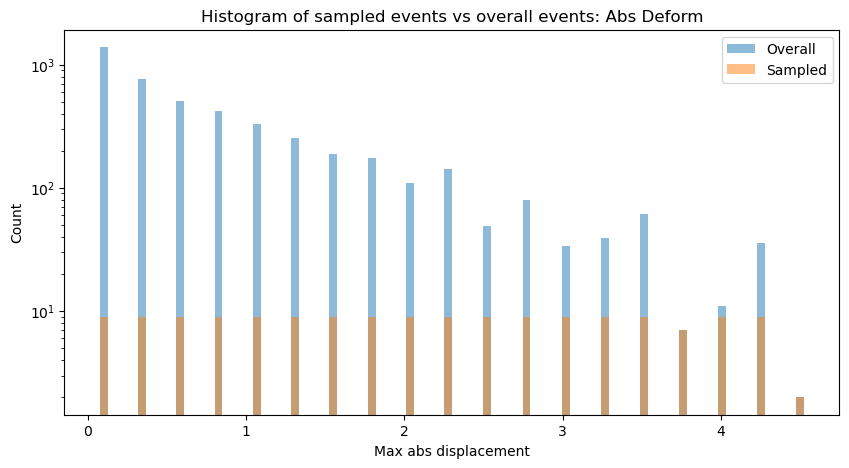

Unique sampled events: 162
thresh_deform_off 2.8 max_deform_off 6.25
bin_def [ 0.1         0.4         0.7         1.          1.3         1.6
  1.9         2.2         2.5         2.8         2.8         3.18333333
  3.56666667  3.95        4.33333333  4.71666667  5.1         5.48333333
  5.86666667  6.25       99.        ] count 21
Sampling 9 events in bin (0.1, 0.4) from 596 events
Sampling 9 events in bin (0.4, 0.7) from 789 events
Sampling 9 events in bin (0.7, 0.9999999999999999) from 644 events
Sampling 9 events in bin (0.9999999999999999, 1.3) from 586 events
Sampling 9 events in bin (1.3, 1.6) from 437 events
Sampling 9 events in bin (1.6, 1.9) from 381 events
Sampling 9 events in bin (1.9, 2.2) from 285 events
Sampling 9 events in bin (2.2, 2.5) from 224 events
Sampling 9 events in bin (2.5, 2.8) from 167 events
Sampling 9 events in bin (2.8, 2.8) from 0 events
Sampling 9 events in bin (2.8, 3.183333333333333) from 168 events
Sampling 9 events in bin (3.183333333333333, 3.566

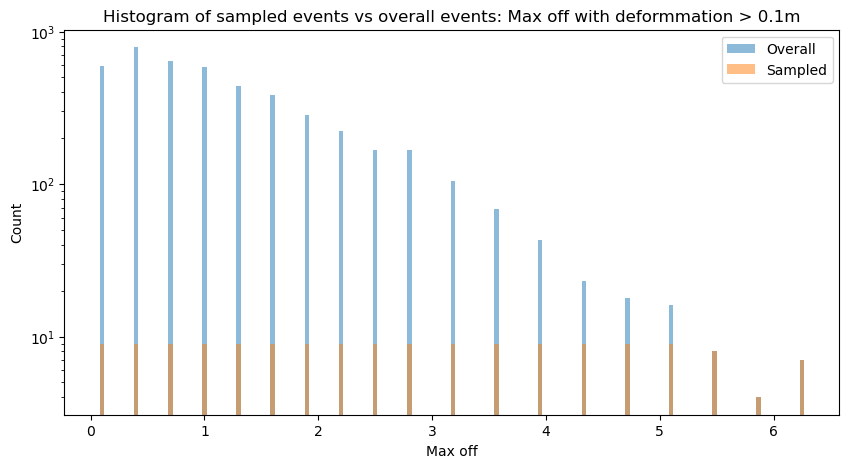

Unique sampled events: 163
thresh_BS_off 1.58 max_BS_off 4.25
bin_def [ 0.1         0.26444444  0.42888889  0.59333333  0.75777778  0.92222222
  1.08666667  1.25111111  1.41555556  1.58        1.58        1.87666667
  2.17333333  2.47        2.76666667  3.06333333  3.36        3.65666667
  3.95333333  4.25       99.        ] count 21
Sampling 9 events in bin (0.1, 0.2644444444444445) from 1294 events
Sampling 9 events in bin (0.2644444444444445, 0.4288888888888889) from 1359 events
Sampling 9 events in bin (0.4288888888888889, 0.5933333333333334) from 1199 events
Sampling 9 events in bin (0.5933333333333334, 0.7577777777777778) from 822 events
Sampling 9 events in bin (0.7577777777777778, 0.9222222222222222) from 732 events
Sampling 9 events in bin (0.9222222222222222, 1.0866666666666667) from 536 events
Sampling 9 events in bin (1.0866666666666667, 1.2511111111111113) from 446 events
Sampling 9 events in bin (1.2511111111111113, 1.4155555555555557) from 313 events
Sampling 9 events in

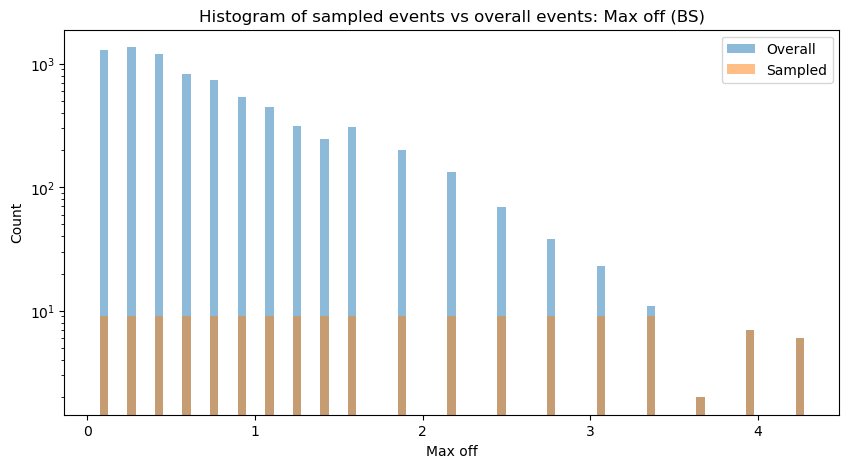

Unique sampled events: 159
thresh_PS_off 1.7 max_PS_off 3.6
bin_def [ 0.1         0.27777778  0.45555556  0.63333333  0.81111111  0.98888889
  1.16666667  1.34444444  1.52222222  1.7         1.7         1.91111111
  2.12222222  2.33333333  2.54444444  2.75555556  2.96666667  3.17777778
  3.38888889  3.6        99.        ] count 21
Sampling 27 events in bin (0.1, 0.2777777777777778) from 2892 events
Sampling 27 events in bin (0.2777777777777778, 0.4555555555555555) from 2127 events
Sampling 27 events in bin (0.4555555555555555, 0.6333333333333332) from 1752 events
Sampling 27 events in bin (0.6333333333333332, 0.811111111111111) from 1230 events
Sampling 27 events in bin (0.811111111111111, 0.9888888888888888) from 1008 events
Sampling 27 events in bin (0.9888888888888888, 1.1666666666666665) from 1048 events
Sampling 27 events in bin (1.1666666666666665, 1.3444444444444443) from 909 events
Sampling 27 events in bin (1.3444444444444443, 1.5222222222222221) from 713 events
Sampling 27 e

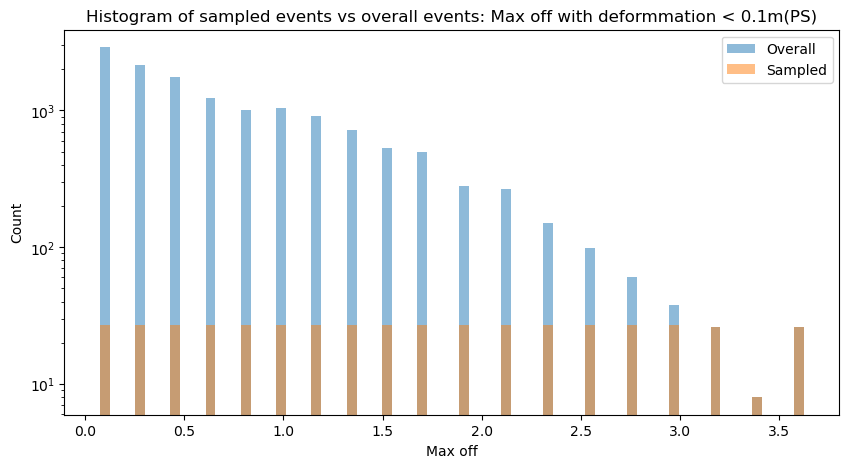

Unique sampled events: 492
test set size: 52589


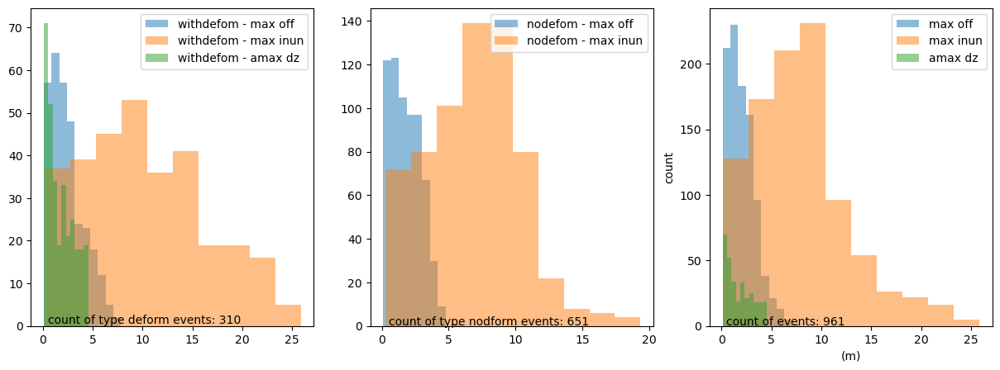

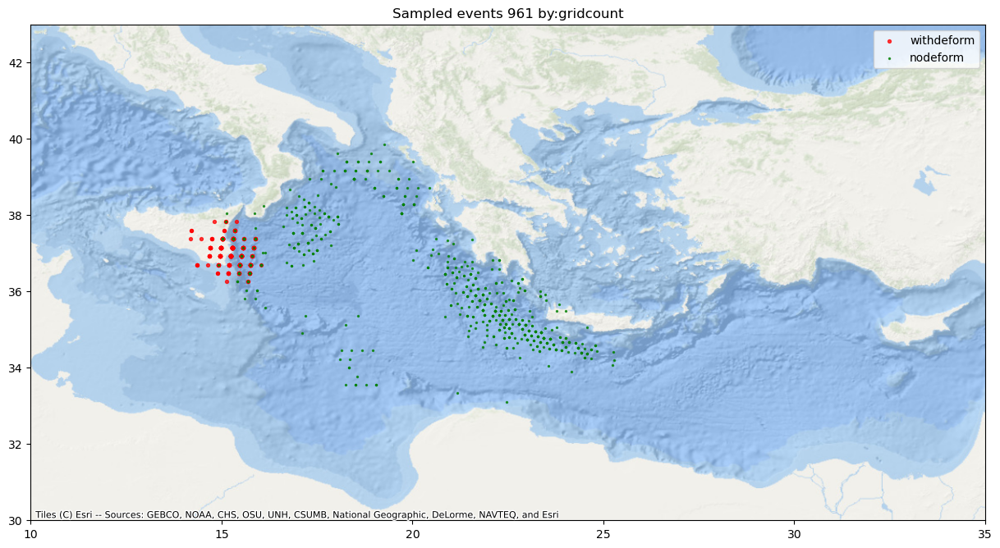

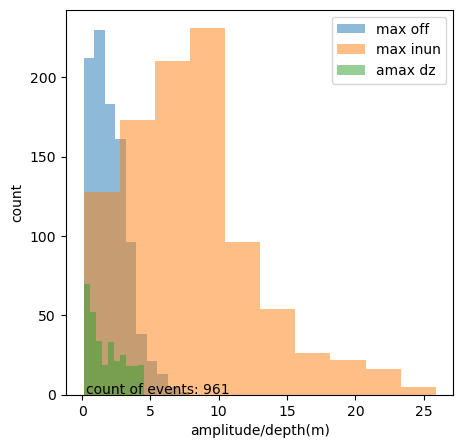

In [35]:
X = 1
#emphasis above a threshold(90%) 
max_deform = 4.5
samples_per_bin = 9 * X
bin_splits = 10

bin_def_1 =  np.linspace(start,thresh_deform,bin_splits)
bin_def_2 =  np.linspace(thresh_deform,max_deform, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform',thresh_deform,'max_deform',max_deform)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step0 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_absdz')
#set as dataframe
sample_step0 = pd.concat(sample_step0, axis=0)

#update other parameters from combined
sample_step0 = pd.merge(sample_step0, combined, on='id', how='left')

#keep only unique events
sample_step0 = sample_step0.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_absdz'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step0['max_absdz'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max abs displacement', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Abs Deform')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step0['id'].unique()))

#override max_deform_off
max_deform_off = 6.25

bin_def_1 =  np.linspace(start,thresh_deform_off,bin_splits)
bin_def_2 =  np.linspace(thresh_deform_off,max_deform_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform_off',thresh_deform_off,'max_deform_off',max_deform_off)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step1 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')
#set as dataframe
sample_step1 = pd.concat(sample_step1, axis=0)
#update other parameters from combined
sample_step1 = pd.merge(sample_step1, combined, on='id', how='left')
#keep only unique events
sample_step1 = sample_step1.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step1['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.04,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.04, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation > 0.1m')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step1['id'].unique()))

#override max_off
max_BS_off = 4.25

bin_def_1 =  np.linspace(start,thresh_BS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_BS_off,max_BS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_BS_off',thresh_BS_off,'max_BS_off',max_BS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step3 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('BS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step3 = pd.concat(sample_step3, axis=0)
#update other parameters from combined
sample_step3 = pd.merge(sample_step3, combined, on='id', how='left')
#keep only unique events
sample_step3 = sample_step3.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('BS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step3['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off (BS)')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step3['id'].unique()))

#override max
samples_per_bin = samples_per_bin *3
max_PS_off = 3.6

bin_def_1 =  np.linspace(start,thresh_PS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_PS_off,max_PS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_PS_off',thresh_PS_off,'max_PS_off',max_PS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step2 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('PS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step2 = pd.concat(sample_step2, axis=0)
#update other parameters from combined
sample_step2 = pd.merge(sample_step2, combined, on='id', how='left')
#keep only unique events
sample_step2 = sample_step2.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('PS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step2['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation < 0.1m(PS)')
plt.legend()
plt.show()

print('Unique sampled events:',len(sample_step2['id'].unique()))
#merge samples to get final sample
sample_test = pd.concat([sample_step0,sample_step1,sample_step2,sample_step3], axis=0)
#keep only unique events
sample_test = sample_test.drop_duplicates(subset=['id'])

#check if plot folder exists
if not os.path.exists(MLDir + f'/model/{reg}/plot'):
    os.makedirs(MLDir + f'/model/{reg}/plot')


#plot 
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].hist(sample_test[sample_test['event_type']==0]['max_off'], bins=bin_splits, alpha=0.5, label='withdefom - max off')
axs[0].hist(sample_test[sample_test['event_type']==0]['dmax'], bins=bin_splits, alpha=0.5, label='withdefom - max inun')
axs[0].hist(sample_test[sample_test['event_type']==0]['max_absdz'], bins=bin_splits, alpha=0.5, label='withdefom - amax dz')
axs[0].text(0.5, 0.5, 'count of type deform events: '+str(len(sample_test[sample_test['event_type']==0])))
axs[0].legend(loc='upper right')

axs[1].hist(sample_test[sample_test['event_type']==1]['max_off'], bins=bin_splits, alpha=0.5, label='nodefom - max off')
axs[1].hist(sample_test[sample_test['event_type']==1]['dmax'], bins=bin_splits, alpha=0.5, label='nodefom - max inun')
axs[1].text(0.5, 0.5,'count of type nodform events: '+str(len(sample_test[sample_test['event_type']==1])))
axs[1].legend(loc='upper right')

axs[2].hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs[2].hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs[2].hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs[2].text(0.5, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs[2].legend(loc='upper right')
#label axes
axs[2].set(xlabel='(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events_splits{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, ax = plt.subplots(figsize=(15,10))
ax.title.set_text('Sampled events ' + str(len(sample_test)) + ' by:' + wt_para)
ax = plt.scatter(sample_test[sample_test['event_type']==0]['lon'], sample_test[sample_test['event_type']==0]['lat'], alpha=0.75, label='withdeform',s=8, color='red')
ax = plt.scatter(sample_test[sample_test['event_type']==1]['lon'], sample_test[sample_test['event_type']==1]['lat'], alpha=0.75, label='nodeform', s=2, color='green')
plt.legend(loc='upper right')
plt.xlim(10, 35)
plt.ylim(30, 43)
ax = plt.gca()
cx.add_basemap(ax,crs='EPSG:4326', source=cx.providers.Esri.OceanBasemap)
plt.savefig(MLDir + f'/model/{reg}/plot/samplemap_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, axs = plt.subplots(1, 1, figsize=(5, 5))
axs.hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs.hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs.hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs.text(0.25, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs.legend(loc='upper right')
#label axes
axs.set(xlabel='amplitude/depth(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

#save list of ids to txt file for training
#for building model
sample_test['id'].to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/sample_events{str(len(sample_test))}_{reg}_{columnname}.txt', header=False, index=None)

#evaluation of model by removing sample from combined ie the test set
test = combined[~combined['id'].isin(sample_test['id'])]
len_test = len(test['id'].unique())
print('test set size:',len_test)
pd.DataFrame(test['id'].unique()).to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_test_{reg}_{str(len_test)}_{str(len(sample_test))}.txt', header=False, index=None)


thresh_deform 2.2764000000000006 max_deform 4.5
bin_def [ 0.1         0.34182222  0.58364444  0.82546667  1.06728889  1.30911111
  1.55093333  1.79275556  2.03457778  2.2764      2.2764      2.52346667
  2.77053333  3.0176      3.26466667  3.51173333  3.7588      4.00586667
  4.25293333  4.5        99.        ] count 21
Sampling 18 events in bin (0.1, 0.34182222222222225) from 1384 events
Sampling 18 events in bin (0.34182222222222225, 0.5836444444444445) from 768 events
Sampling 18 events in bin (0.5836444444444445, 0.8254666666666668) from 506 events
Sampling 18 events in bin (0.8254666666666668, 1.0672888888888892) from 417 events
Sampling 18 events in bin (1.0672888888888892, 1.3091111111111116) from 329 events
Sampling 18 events in bin (1.3091111111111116, 1.5509333333333337) from 255 events
Sampling 18 events in bin (1.5509333333333337, 1.7927555555555559) from 189 events
Sampling 18 events in bin (1.7927555555555559, 2.0345777777777783) from 176 events
Sampling 18 events in bin 

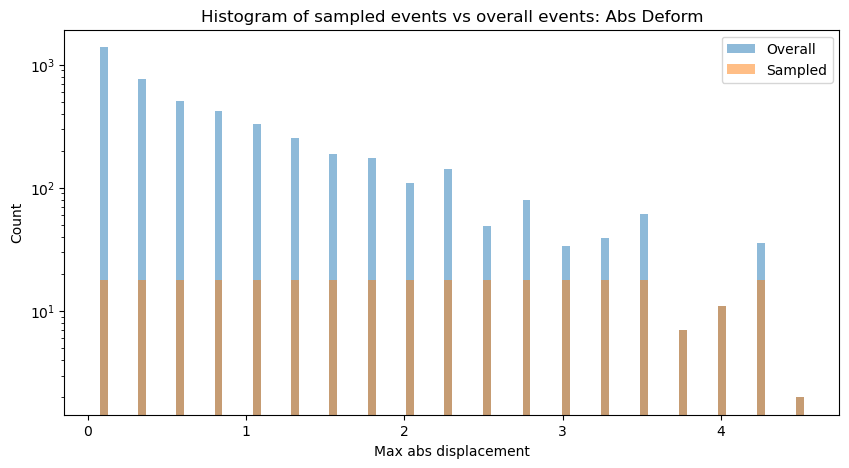

Unique sampled events: 308
thresh_deform_off 2.8 max_deform_off 6.25
bin_def [ 0.1         0.4         0.7         1.          1.3         1.6
  1.9         2.2         2.5         2.8         2.8         3.18333333
  3.56666667  3.95        4.33333333  4.71666667  5.1         5.48333333
  5.86666667  6.25       99.        ] count 21
Sampling 18 events in bin (0.1, 0.4) from 596 events
Sampling 18 events in bin (0.4, 0.7) from 789 events
Sampling 18 events in bin (0.7, 0.9999999999999999) from 644 events
Sampling 18 events in bin (0.9999999999999999, 1.3) from 586 events
Sampling 18 events in bin (1.3, 1.6) from 437 events
Sampling 18 events in bin (1.6, 1.9) from 381 events
Sampling 18 events in bin (1.9, 2.2) from 285 events
Sampling 18 events in bin (2.2, 2.5) from 224 events
Sampling 18 events in bin (2.5, 2.8) from 167 events
Sampling 18 events in bin (2.8, 2.8) from 0 events
Sampling 18 events in bin (2.8, 3.183333333333333) from 168 events
Sampling 18 events in bin (3.1833333333

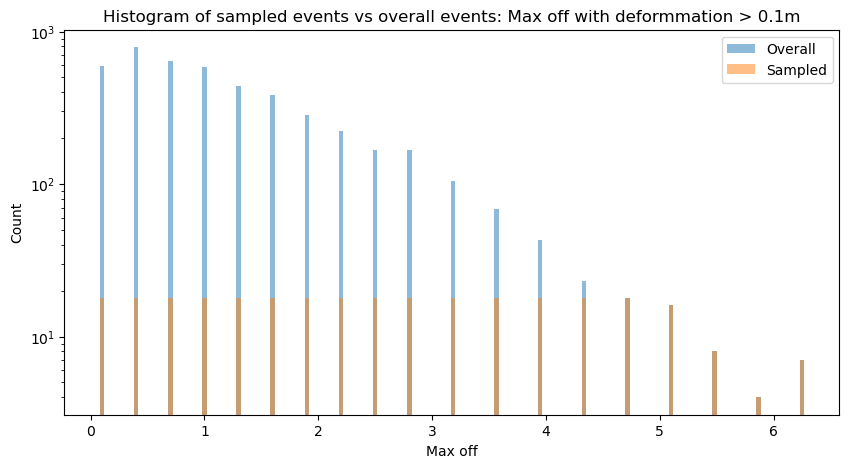

Unique sampled events: 305
thresh_BS_off 1.58 max_BS_off 4.25
bin_def [ 0.1         0.26444444  0.42888889  0.59333333  0.75777778  0.92222222
  1.08666667  1.25111111  1.41555556  1.58        1.58        1.87666667
  2.17333333  2.47        2.76666667  3.06333333  3.36        3.65666667
  3.95333333  4.25       99.        ] count 21
Sampling 18 events in bin (0.1, 0.2644444444444445) from 1294 events
Sampling 18 events in bin (0.2644444444444445, 0.4288888888888889) from 1359 events
Sampling 18 events in bin (0.4288888888888889, 0.5933333333333334) from 1199 events
Sampling 18 events in bin (0.5933333333333334, 0.7577777777777778) from 822 events
Sampling 18 events in bin (0.7577777777777778, 0.9222222222222222) from 732 events
Sampling 18 events in bin (0.9222222222222222, 1.0866666666666667) from 536 events
Sampling 18 events in bin (1.0866666666666667, 1.2511111111111113) from 446 events
Sampling 18 events in bin (1.2511111111111113, 1.4155555555555557) from 313 events
Sampling 18 

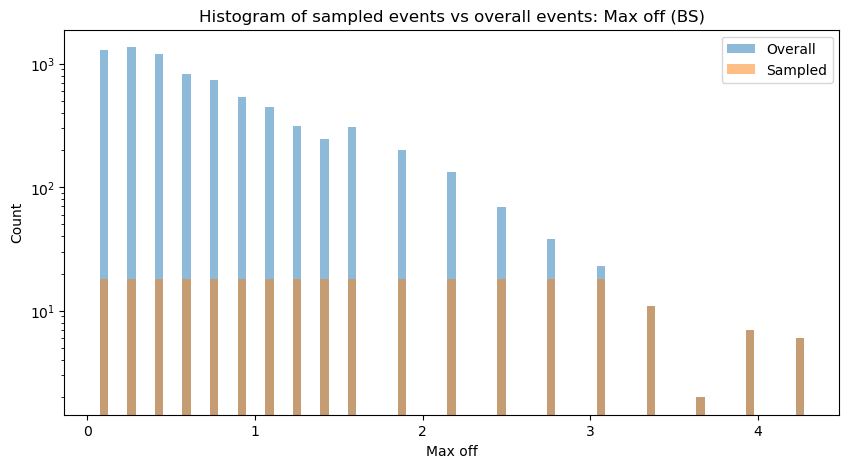

Unique sampled events: 296
thresh_PS_off 1.7 max_PS_off 3.6
bin_def [ 0.1         0.27777778  0.45555556  0.63333333  0.81111111  0.98888889
  1.16666667  1.34444444  1.52222222  1.7         1.7         1.91111111
  2.12222222  2.33333333  2.54444444  2.75555556  2.96666667  3.17777778
  3.38888889  3.6        99.        ] count 21
Sampling 54 events in bin (0.1, 0.2777777777777778) from 2892 events
Sampling 54 events in bin (0.2777777777777778, 0.4555555555555555) from 2127 events
Sampling 54 events in bin (0.4555555555555555, 0.6333333333333332) from 1752 events
Sampling 54 events in bin (0.6333333333333332, 0.811111111111111) from 1230 events
Sampling 54 events in bin (0.811111111111111, 0.9888888888888888) from 1008 events
Sampling 54 events in bin (0.9888888888888888, 1.1666666666666665) from 1048 events
Sampling 54 events in bin (1.1666666666666665, 1.3444444444444443) from 909 events
Sampling 54 events in bin (1.3444444444444443, 1.5222222222222221) from 713 events
Sampling 54 e

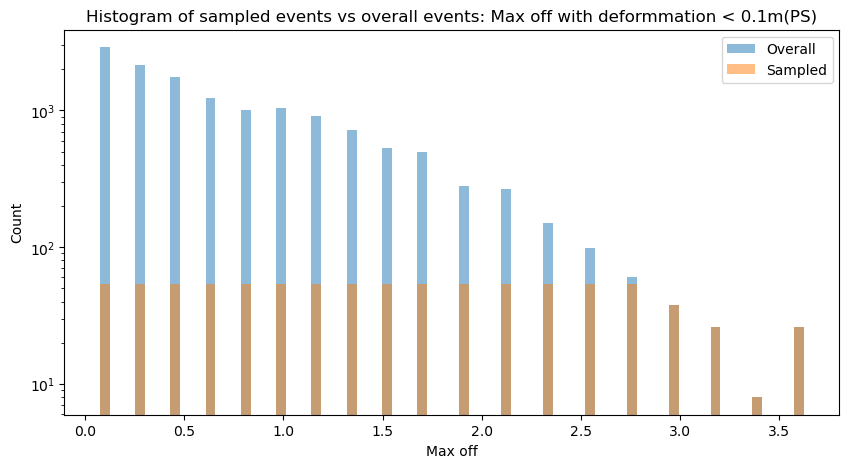

Unique sampled events: 908
test set size: 51777


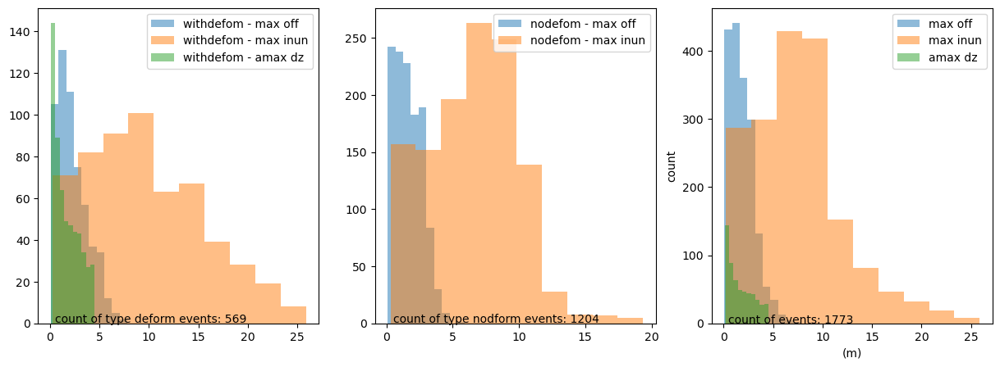

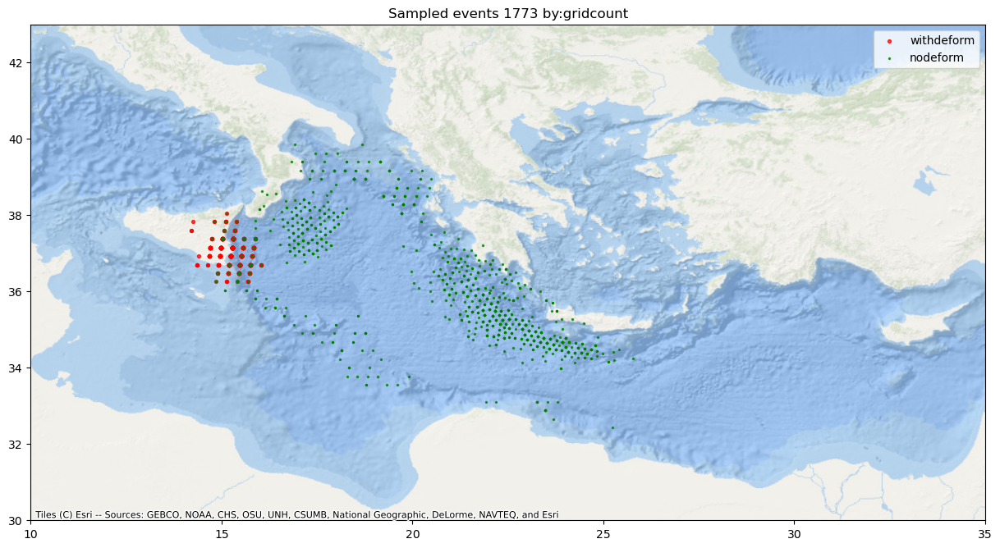

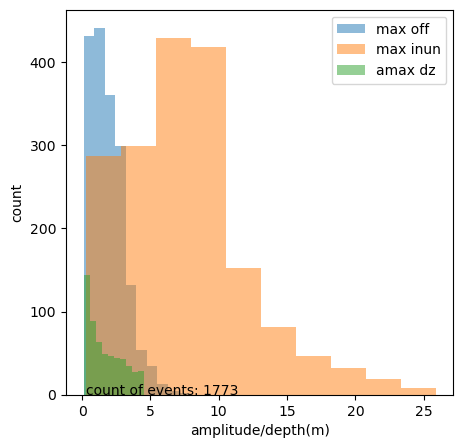

In [36]:
X = 1
#emphasis above a threshold(90%) 
max_deform = 4.5
samples_per_bin = 18 * X
bin_splits = 10

bin_def_1 =  np.linspace(start,thresh_deform,bin_splits)
bin_def_2 =  np.linspace(thresh_deform,max_deform, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform',thresh_deform,'max_deform',max_deform)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step0 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_absdz')
#set as dataframe
sample_step0 = pd.concat(sample_step0, axis=0)

#update other parameters from combined
sample_step0 = pd.merge(sample_step0, combined, on='id', how='left')

#keep only unique events
sample_step0 = sample_step0.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_absdz'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step0['max_absdz'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max abs displacement', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Abs Deform')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step0['id'].unique()))

#override max_deform_off
max_deform_off = 6.25

bin_def_1 =  np.linspace(start,thresh_deform_off,bin_splits)
bin_def_2 =  np.linspace(thresh_deform_off,max_deform_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform_off',thresh_deform_off,'max_deform_off',max_deform_off)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step1 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')
#set as dataframe
sample_step1 = pd.concat(sample_step1, axis=0)
#update other parameters from combined
sample_step1 = pd.merge(sample_step1, combined, on='id', how='left')
#keep only unique events
sample_step1 = sample_step1.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step1['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.04,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.04, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation > 0.1m')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step1['id'].unique()))

#override max_off
max_BS_off = 4.25

bin_def_1 =  np.linspace(start,thresh_BS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_BS_off,max_BS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_BS_off',thresh_BS_off,'max_BS_off',max_BS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step3 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('BS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step3 = pd.concat(sample_step3, axis=0)
#update other parameters from combined
sample_step3 = pd.merge(sample_step3, combined, on='id', how='left')
#keep only unique events
sample_step3 = sample_step3.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('BS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step3['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off (BS)')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step3['id'].unique()))

#override max
samples_per_bin = samples_per_bin *3
max_PS_off = 3.6

bin_def_1 =  np.linspace(start,thresh_PS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_PS_off,max_PS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_PS_off',thresh_PS_off,'max_PS_off',max_PS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step2 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('PS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step2 = pd.concat(sample_step2, axis=0)
#update other parameters from combined
sample_step2 = pd.merge(sample_step2, combined, on='id', how='left')
#keep only unique events
sample_step2 = sample_step2.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('PS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step2['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation < 0.1m(PS)')
plt.legend()
plt.show()

print('Unique sampled events:',len(sample_step2['id'].unique()))
#merge samples to get final sample
sample_test = pd.concat([sample_step0,sample_step1,sample_step2,sample_step3], axis=0)
#keep only unique events
sample_test = sample_test.drop_duplicates(subset=['id'])

#check if plot folder exists
if not os.path.exists(MLDir + f'/model/{reg}/plot'):
    os.makedirs(MLDir + f'/model/{reg}/plot')


#plot 
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].hist(sample_test[sample_test['event_type']==0]['max_off'], bins=bin_splits, alpha=0.5, label='withdefom - max off')
axs[0].hist(sample_test[sample_test['event_type']==0]['dmax'], bins=bin_splits, alpha=0.5, label='withdefom - max inun')
axs[0].hist(sample_test[sample_test['event_type']==0]['max_absdz'], bins=bin_splits, alpha=0.5, label='withdefom - amax dz')
axs[0].text(0.5, 0.5, 'count of type deform events: '+str(len(sample_test[sample_test['event_type']==0])))
axs[0].legend(loc='upper right')

axs[1].hist(sample_test[sample_test['event_type']==1]['max_off'], bins=bin_splits, alpha=0.5, label='nodefom - max off')
axs[1].hist(sample_test[sample_test['event_type']==1]['dmax'], bins=bin_splits, alpha=0.5, label='nodefom - max inun')
axs[1].text(0.5, 0.5,'count of type nodform events: '+str(len(sample_test[sample_test['event_type']==1])))
axs[1].legend(loc='upper right')

axs[2].hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs[2].hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs[2].hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs[2].text(0.5, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs[2].legend(loc='upper right')
#label axes
axs[2].set(xlabel='(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events_splits{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, ax = plt.subplots(figsize=(15,10))
ax.title.set_text('Sampled events ' + str(len(sample_test)) + ' by:' + wt_para)
ax = plt.scatter(sample_test[sample_test['event_type']==0]['lon'], sample_test[sample_test['event_type']==0]['lat'], alpha=0.75, label='withdeform',s=8, color='red')
ax = plt.scatter(sample_test[sample_test['event_type']==1]['lon'], sample_test[sample_test['event_type']==1]['lat'], alpha=0.75, label='nodeform', s=2, color='green')
plt.legend(loc='upper right')
plt.xlim(10, 35)
plt.ylim(30, 43)
ax = plt.gca()
cx.add_basemap(ax,crs='EPSG:4326', source=cx.providers.Esri.OceanBasemap)
plt.savefig(MLDir + f'/model/{reg}/plot/samplemap_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, axs = plt.subplots(1, 1, figsize=(5, 5))
axs.hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs.hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs.hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs.text(0.25, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs.legend(loc='upper right')
#label axes
axs.set(xlabel='amplitude/depth(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

#save list of ids to txt file for training
#for building model
sample_test['id'].to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/sample_events{str(len(sample_test))}_{reg}_{columnname}.txt', header=False, index=None)

#evaluation of model by removing sample from combined ie the test set
test = combined[~combined['id'].isin(sample_test['id'])]
len_test = len(test['id'].unique())
print('test set size:',len_test)
pd.DataFrame(test['id'].unique()).to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_test_{reg}_{str(len_test)}_{str(len(sample_test))}.txt', header=False, index=None)


thresh_deform 2.2764000000000006 max_deform 4.5
bin_def [ 0.1         0.34182222  0.58364444  0.82546667  1.06728889  1.30911111
  1.55093333  1.79275556  2.03457778  2.2764      2.2764      2.52346667
  2.77053333  3.0176      3.26466667  3.51173333  3.7588      4.00586667
  4.25293333  4.5        99.        ] count 21
Sampling 42 events in bin (0.1, 0.34182222222222225) from 1384 events
Sampling 42 events in bin (0.34182222222222225, 0.5836444444444445) from 768 events
Sampling 42 events in bin (0.5836444444444445, 0.8254666666666668) from 506 events
Sampling 42 events in bin (0.8254666666666668, 1.0672888888888892) from 417 events
Sampling 42 events in bin (1.0672888888888892, 1.3091111111111116) from 329 events
Sampling 42 events in bin (1.3091111111111116, 1.5509333333333337) from 255 events
Sampling 42 events in bin (1.5509333333333337, 1.7927555555555559) from 189 events
Sampling 42 events in bin (1.7927555555555559, 2.0345777777777783) from 176 events
Sampling 42 events in bin 

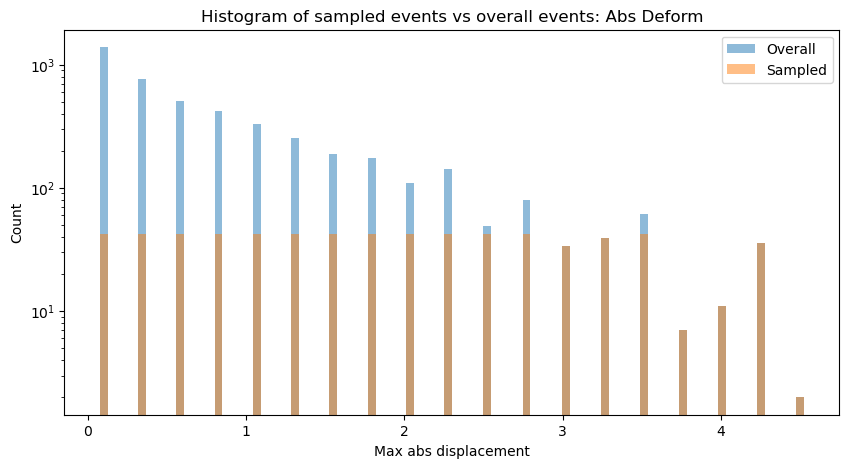

Unique sampled events: 675
thresh_deform_off 2.8 max_deform_off 6.25
bin_def [ 0.1         0.4         0.7         1.          1.3         1.6
  1.9         2.2         2.5         2.8         2.8         3.18333333
  3.56666667  3.95        4.33333333  4.71666667  5.1         5.48333333
  5.86666667  6.25       99.        ] count 21
Sampling 42 events in bin (0.1, 0.4) from 596 events
Sampling 42 events in bin (0.4, 0.7) from 789 events
Sampling 42 events in bin (0.7, 0.9999999999999999) from 644 events
Sampling 42 events in bin (0.9999999999999999, 1.3) from 586 events
Sampling 42 events in bin (1.3, 1.6) from 437 events
Sampling 42 events in bin (1.6, 1.9) from 381 events
Sampling 42 events in bin (1.9, 2.2) from 285 events
Sampling 42 events in bin (2.2, 2.5) from 224 events
Sampling 42 events in bin (2.5, 2.8) from 167 events
Sampling 42 events in bin (2.8, 2.8) from 0 events
Sampling 42 events in bin (2.8, 3.183333333333333) from 168 events
Sampling 42 events in bin (3.1833333333

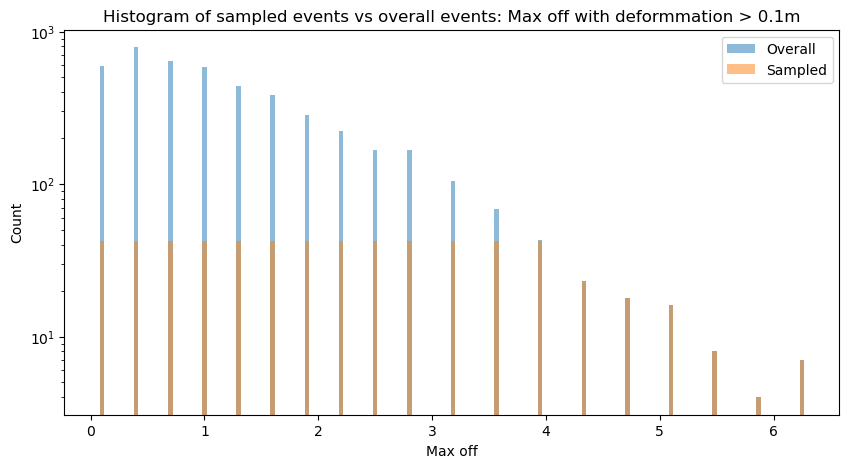

Unique sampled events: 622
thresh_BS_off 1.58 max_BS_off 4.25
bin_def [ 0.1         0.26444444  0.42888889  0.59333333  0.75777778  0.92222222
  1.08666667  1.25111111  1.41555556  1.58        1.58        1.87666667
  2.17333333  2.47        2.76666667  3.06333333  3.36        3.65666667
  3.95333333  4.25       99.        ] count 21
Sampling 42 events in bin (0.1, 0.2644444444444445) from 1294 events
Sampling 42 events in bin (0.2644444444444445, 0.4288888888888889) from 1359 events
Sampling 42 events in bin (0.4288888888888889, 0.5933333333333334) from 1199 events
Sampling 42 events in bin (0.5933333333333334, 0.7577777777777778) from 822 events
Sampling 42 events in bin (0.7577777777777778, 0.9222222222222222) from 732 events
Sampling 42 events in bin (0.9222222222222222, 1.0866666666666667) from 536 events
Sampling 42 events in bin (1.0866666666666667, 1.2511111111111113) from 446 events
Sampling 42 events in bin (1.2511111111111113, 1.4155555555555557) from 313 events
Sampling 42 

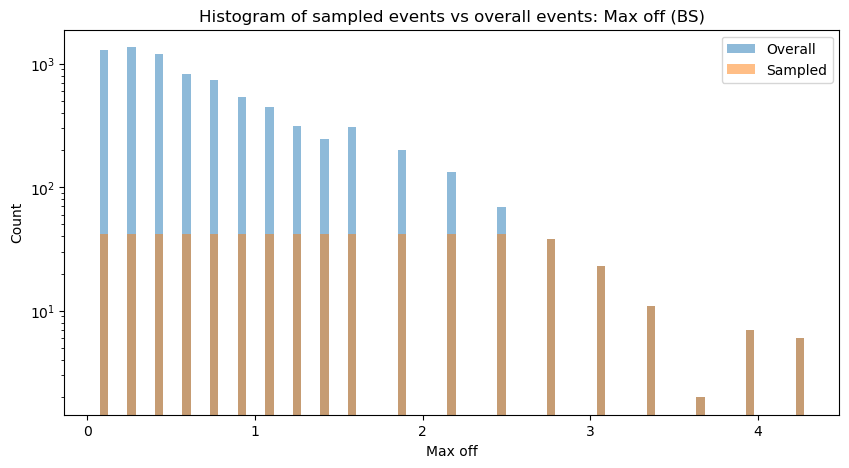

Unique sampled events: 633
thresh_PS_off 1.7 max_PS_off 3.6
bin_def [ 0.1         0.27777778  0.45555556  0.63333333  0.81111111  0.98888889
  1.16666667  1.34444444  1.52222222  1.7         1.7         1.91111111
  2.12222222  2.33333333  2.54444444  2.75555556  2.96666667  3.17777778
  3.38888889  3.6        99.        ] count 21
Sampling 126 events in bin (0.1, 0.2777777777777778) from 2892 events
Sampling 126 events in bin (0.2777777777777778, 0.4555555555555555) from 2127 events
Sampling 126 events in bin (0.4555555555555555, 0.6333333333333332) from 1752 events
Sampling 126 events in bin (0.6333333333333332, 0.811111111111111) from 1230 events
Sampling 126 events in bin (0.811111111111111, 0.9888888888888888) from 1008 events
Sampling 126 events in bin (0.9888888888888888, 1.1666666666666665) from 1048 events
Sampling 126 events in bin (1.1666666666666665, 1.3444444444444443) from 909 events
Sampling 126 events in bin (1.3444444444444443, 1.5222222222222221) from 713 events
Sampl

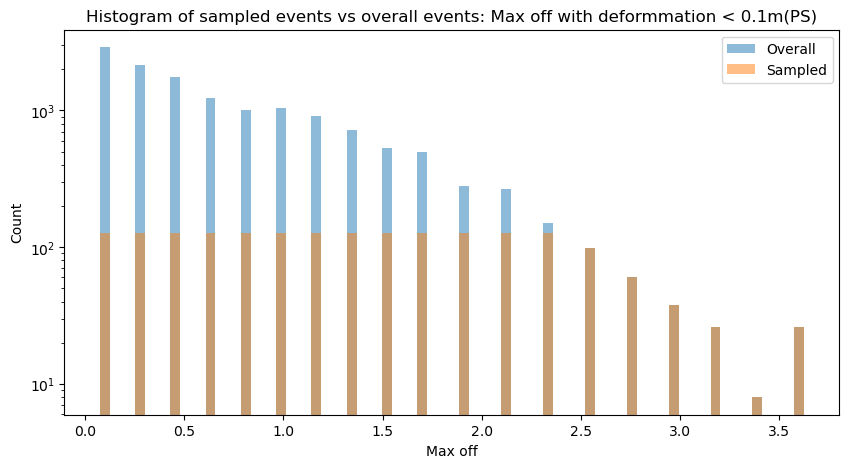

Unique sampled events: 1895
test set size: 49881


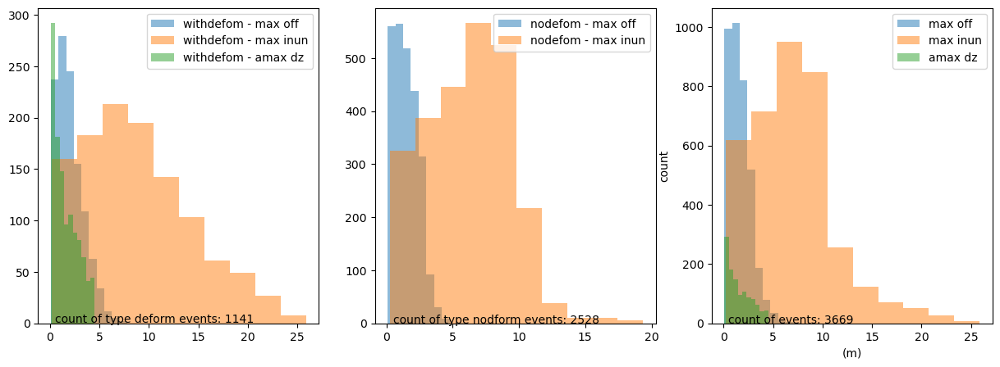

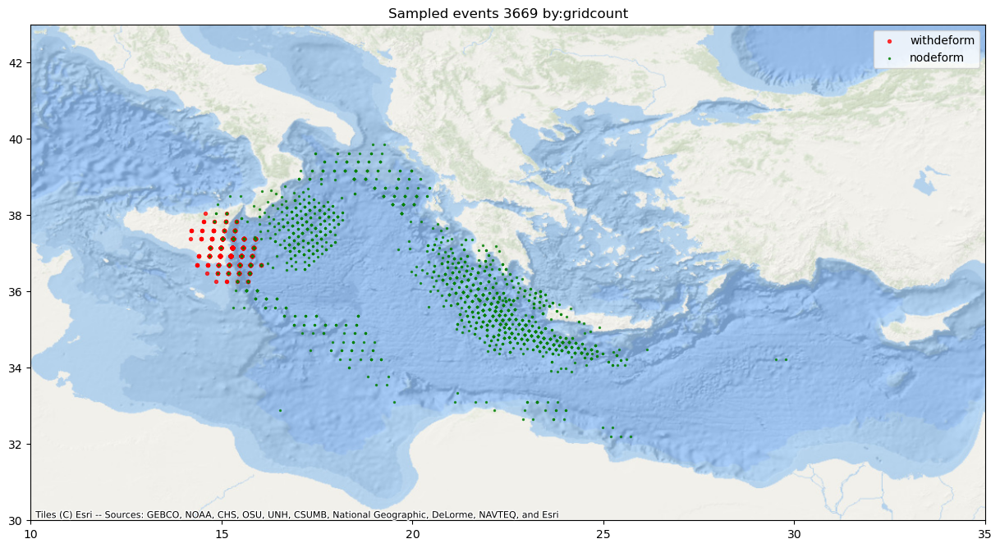

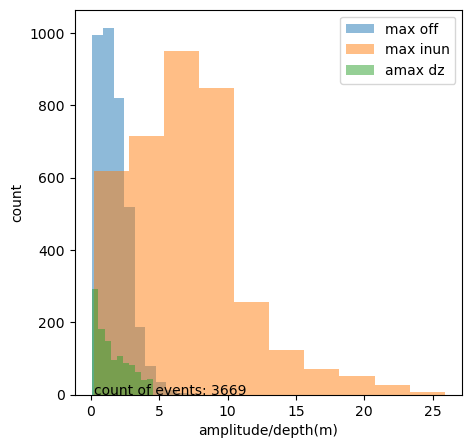

In [37]:
X = 2
#emphasis above a threshold(90%) 
max_deform = 4.5
samples_per_bin = 21 * X
bin_splits = 10

bin_def_1 =  np.linspace(start,thresh_deform,bin_splits)
bin_def_2 =  np.linspace(thresh_deform,max_deform, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform',thresh_deform,'max_deform',max_deform)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step0 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_absdz')
#set as dataframe
sample_step0 = pd.concat(sample_step0, axis=0)

#update other parameters from combined
sample_step0 = pd.merge(sample_step0, combined, on='id', how='left')

#keep only unique events
sample_step0 = sample_step0.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_absdz'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step0['max_absdz'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max abs displacement', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Abs Deform')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step0['id'].unique()))

#override max_deform_off
max_deform_off = 6.25

bin_def_1 =  np.linspace(start,thresh_deform_off,bin_splits)
bin_def_2 =  np.linspace(thresh_deform_off,max_deform_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform_off',thresh_deform_off,'max_deform_off',max_deform_off)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step1 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')
#set as dataframe
sample_step1 = pd.concat(sample_step1, axis=0)
#update other parameters from combined
sample_step1 = pd.merge(sample_step1, combined, on='id', how='left')
#keep only unique events
sample_step1 = sample_step1.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step1['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.04,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.04, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation > 0.1m')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step1['id'].unique()))

#override max_off
max_BS_off = 4.25

bin_def_1 =  np.linspace(start,thresh_BS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_BS_off,max_BS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_BS_off',thresh_BS_off,'max_BS_off',max_BS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step3 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('BS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step3 = pd.concat(sample_step3, axis=0)
#update other parameters from combined
sample_step3 = pd.merge(sample_step3, combined, on='id', how='left')
#keep only unique events
sample_step3 = sample_step3.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('BS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step3['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off (BS)')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step3['id'].unique()))

#override max
samples_per_bin = samples_per_bin *3
max_PS_off = 3.6

bin_def_1 =  np.linspace(start,thresh_PS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_PS_off,max_PS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_PS_off',thresh_PS_off,'max_PS_off',max_PS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step2 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('PS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step2 = pd.concat(sample_step2, axis=0)
#update other parameters from combined
sample_step2 = pd.merge(sample_step2, combined, on='id', how='left')
#keep only unique events
sample_step2 = sample_step2.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('PS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step2['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation < 0.1m(PS)')
plt.legend()
plt.show()

print('Unique sampled events:',len(sample_step2['id'].unique()))
#merge samples to get final sample
sample_test = pd.concat([sample_step0,sample_step1,sample_step2,sample_step3], axis=0)
#keep only unique events
sample_test = sample_test.drop_duplicates(subset=['id'])

#check if plot folder exists
if not os.path.exists(MLDir + f'/model/{reg}/plot'):
    os.makedirs(MLDir + f'/model/{reg}/plot')


#plot 
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].hist(sample_test[sample_test['event_type']==0]['max_off'], bins=bin_splits, alpha=0.5, label='withdefom - max off')
axs[0].hist(sample_test[sample_test['event_type']==0]['dmax'], bins=bin_splits, alpha=0.5, label='withdefom - max inun')
axs[0].hist(sample_test[sample_test['event_type']==0]['max_absdz'], bins=bin_splits, alpha=0.5, label='withdefom - amax dz')
axs[0].text(0.5, 0.5, 'count of type deform events: '+str(len(sample_test[sample_test['event_type']==0])))
axs[0].legend(loc='upper right')

axs[1].hist(sample_test[sample_test['event_type']==1]['max_off'], bins=bin_splits, alpha=0.5, label='nodefom - max off')
axs[1].hist(sample_test[sample_test['event_type']==1]['dmax'], bins=bin_splits, alpha=0.5, label='nodefom - max inun')
axs[1].text(0.5, 0.5,'count of type nodform events: '+str(len(sample_test[sample_test['event_type']==1])))
axs[1].legend(loc='upper right')

axs[2].hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs[2].hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs[2].hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs[2].text(0.5, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs[2].legend(loc='upper right')
#label axes
axs[2].set(xlabel='(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events_splits{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, ax = plt.subplots(figsize=(15,10))
ax.title.set_text('Sampled events ' + str(len(sample_test)) + ' by:' + wt_para)
ax = plt.scatter(sample_test[sample_test['event_type']==0]['lon'], sample_test[sample_test['event_type']==0]['lat'], alpha=0.75, label='withdeform',s=8, color='red')
ax = plt.scatter(sample_test[sample_test['event_type']==1]['lon'], sample_test[sample_test['event_type']==1]['lat'], alpha=0.75, label='nodeform', s=2, color='green')
plt.legend(loc='upper right')
plt.xlim(10, 35)
plt.ylim(30, 43)
ax = plt.gca()
cx.add_basemap(ax,crs='EPSG:4326', source=cx.providers.Esri.OceanBasemap)
plt.savefig(MLDir + f'/model/{reg}/plot/samplemap_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, axs = plt.subplots(1, 1, figsize=(5, 5))
axs.hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs.hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs.hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs.text(0.25, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs.legend(loc='upper right')
#label axes
axs.set(xlabel='amplitude/depth(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

#save list of ids to txt file for training
#for building model
sample_test['id'].to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/sample_events{str(len(sample_test))}_{reg}_{columnname}.txt', header=False, index=None)

#evaluation of model by removing sample from combined ie the test set
test = combined[~combined['id'].isin(sample_test['id'])]
len_test = len(test['id'].unique())
print('test set size:',len_test)
pd.DataFrame(test['id'].unique()).to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_test_{reg}_{str(len_test)}_{str(len(sample_test))}.txt', header=False, index=None)


thresh_deform 2.2764000000000006 max_deform 4.5
bin_def [ 0.1         0.34182222  0.58364444  0.82546667  1.06728889  1.30911111
  1.55093333  1.79275556  2.03457778  2.2764      2.2764      2.52346667
  2.77053333  3.0176      3.26466667  3.51173333  3.7588      4.00586667
  4.25293333  4.5        99.        ] count 21
Sampling 92 events in bin (0.1, 0.34182222222222225) from 1384 events
Sampling 92 events in bin (0.34182222222222225, 0.5836444444444445) from 768 events
Sampling 92 events in bin (0.5836444444444445, 0.8254666666666668) from 506 events
Sampling 92 events in bin (0.8254666666666668, 1.0672888888888892) from 417 events
Sampling 92 events in bin (1.0672888888888892, 1.3091111111111116) from 329 events
Sampling 92 events in bin (1.3091111111111116, 1.5509333333333337) from 255 events
Sampling 92 events in bin (1.5509333333333337, 1.7927555555555559) from 189 events
Sampling 92 events in bin (1.7927555555555559, 2.0345777777777783) from 176 events
Sampling 92 events in bin 

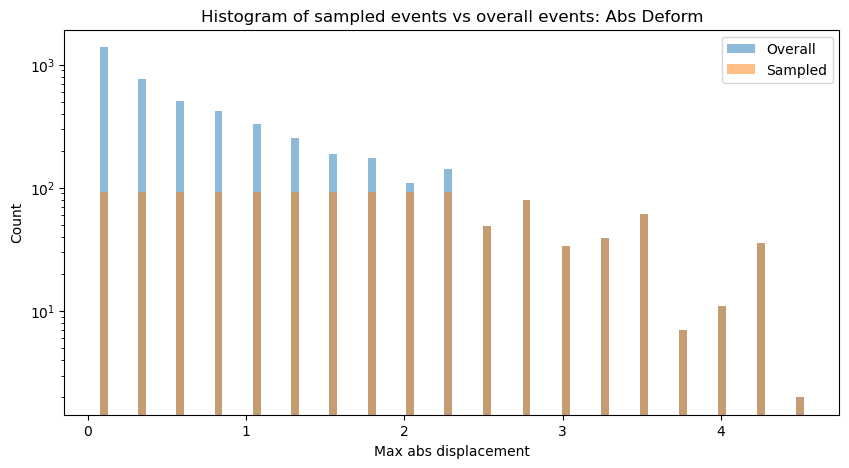

Unique sampled events: 1239
thresh_deform_off 2.8 max_deform_off 6.25
bin_def [ 0.1         0.4         0.7         1.          1.3         1.6
  1.9         2.2         2.5         2.8         2.8         3.18333333
  3.56666667  3.95        4.33333333  4.71666667  5.1         5.48333333
  5.86666667  6.25       99.        ] count 21
Sampling 92 events in bin (0.1, 0.4) from 596 events
Sampling 92 events in bin (0.4, 0.7) from 789 events
Sampling 92 events in bin (0.7, 0.9999999999999999) from 644 events
Sampling 92 events in bin (0.9999999999999999, 1.3) from 586 events
Sampling 92 events in bin (1.3, 1.6) from 437 events
Sampling 92 events in bin (1.6, 1.9) from 381 events
Sampling 92 events in bin (1.9, 2.2) from 285 events
Sampling 92 events in bin (2.2, 2.5) from 224 events
Sampling 92 events in bin (2.5, 2.8) from 167 events
Sampling 92 events in bin (2.8, 2.8) from 0 events
Sampling 92 events in bin (2.8, 3.183333333333333) from 168 events
Sampling 92 events in bin (3.183333333

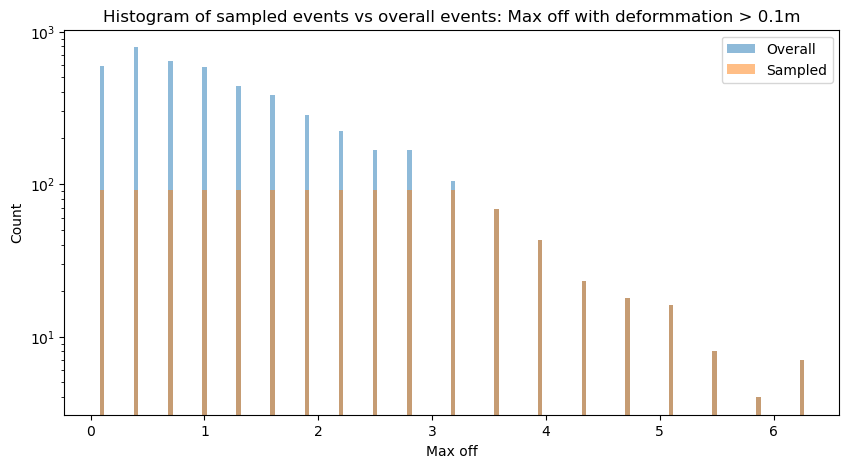

Unique sampled events: 1200
thresh_BS_off 1.58 max_BS_off 4.25
bin_def [ 0.1         0.26444444  0.42888889  0.59333333  0.75777778  0.92222222
  1.08666667  1.25111111  1.41555556  1.58        1.58        1.87666667
  2.17333333  2.47        2.76666667  3.06333333  3.36        3.65666667
  3.95333333  4.25       99.        ] count 21
Sampling 92 events in bin (0.1, 0.2644444444444445) from 1294 events
Sampling 92 events in bin (0.2644444444444445, 0.4288888888888889) from 1359 events
Sampling 92 events in bin (0.4288888888888889, 0.5933333333333334) from 1199 events
Sampling 92 events in bin (0.5933333333333334, 0.7577777777777778) from 822 events
Sampling 92 events in bin (0.7577777777777778, 0.9222222222222222) from 732 events
Sampling 92 events in bin (0.9222222222222222, 1.0866666666666667) from 536 events
Sampling 92 events in bin (1.0866666666666667, 1.2511111111111113) from 446 events
Sampling 92 events in bin (1.2511111111111113, 1.4155555555555557) from 313 events
Sampling 92

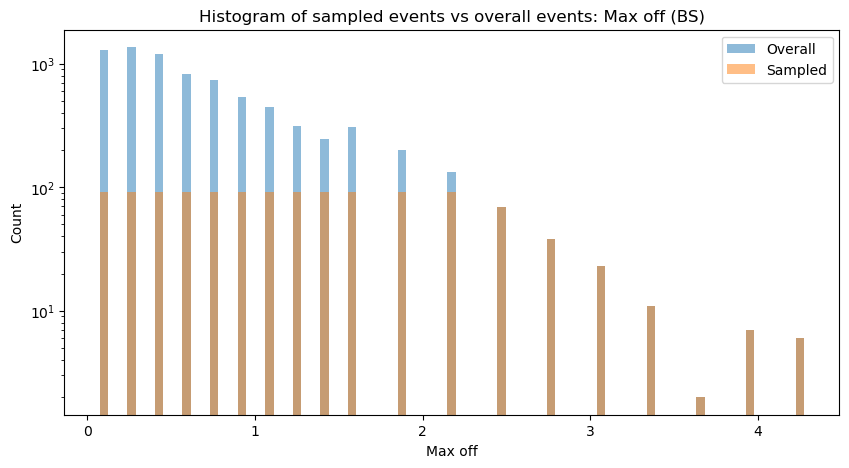

Unique sampled events: 1260
thresh_PS_off 1.7 max_PS_off 3.6
bin_def [ 0.1         0.27777778  0.45555556  0.63333333  0.81111111  0.98888889
  1.16666667  1.34444444  1.52222222  1.7         1.7         1.91111111
  2.12222222  2.33333333  2.54444444  2.75555556  2.96666667  3.17777778
  3.38888889  3.6        99.        ] count 21
Sampling 276 events in bin (0.1, 0.2777777777777778) from 2892 events
Sampling 276 events in bin (0.2777777777777778, 0.4555555555555555) from 2127 events
Sampling 276 events in bin (0.4555555555555555, 0.6333333333333332) from 1752 events
Sampling 276 events in bin (0.6333333333333332, 0.811111111111111) from 1230 events
Sampling 276 events in bin (0.811111111111111, 0.9888888888888888) from 1008 events
Sampling 276 events in bin (0.9888888888888888, 1.1666666666666665) from 1048 events
Sampling 276 events in bin (1.1666666666666665, 1.3444444444444443) from 909 events
Sampling 276 events in bin (1.3444444444444443, 1.5222222222222221) from 713 events
Samp

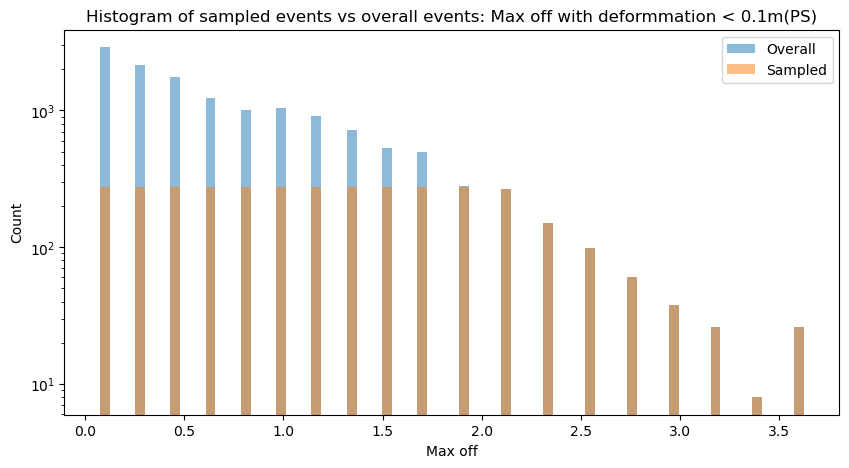

Unique sampled events: 3706
test set size: 46609


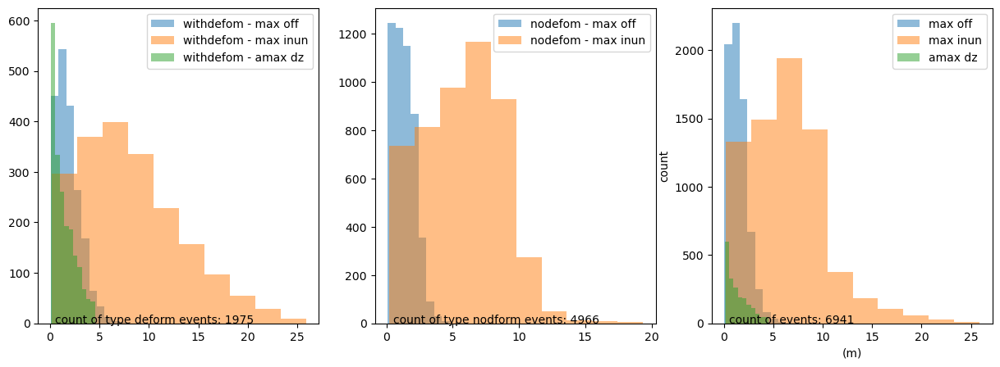

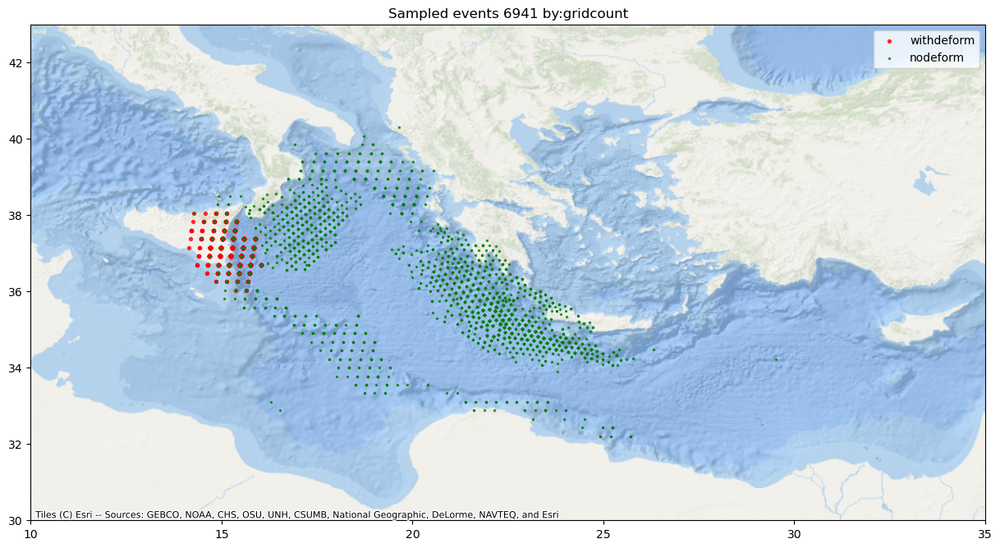

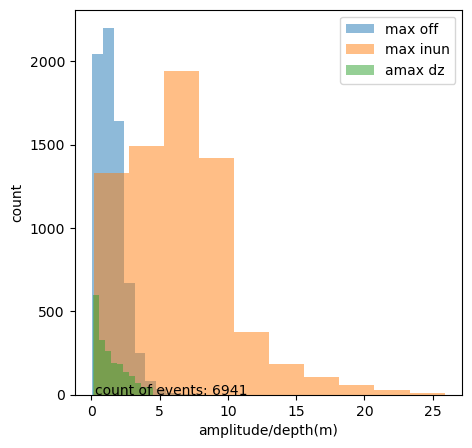

In [38]:
X = 4
#emphasis above a threshold(90%) 
max_deform = 4.5
samples_per_bin = 23 * X
bin_splits = 10

bin_def_1 =  np.linspace(start,thresh_deform,bin_splits)
bin_def_2 =  np.linspace(thresh_deform,max_deform, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform',thresh_deform,'max_deform',max_deform)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step0 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_absdz')
#set as dataframe
sample_step0 = pd.concat(sample_step0, axis=0)

#update other parameters from combined
sample_step0 = pd.merge(sample_step0, combined, on='id', how='left')

#keep only unique events
sample_step0 = sample_step0.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_absdz'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step0['max_absdz'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max abs displacement', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Abs Deform')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step0['id'].unique()))

#override max_deform_off
max_deform_off = 6.25

bin_def_1 =  np.linspace(start,thresh_deform_off,bin_splits)
bin_def_2 =  np.linspace(thresh_deform_off,max_deform_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_deform_off',thresh_deform_off,'max_deform_off',max_deform_off)
print('bin_def',bin_def,'count',len(bin_def))

#sample function
sample_step1 = sample_train_events(combined_half_deform.groupby('event_type').get_group(0),
                                importance_column=wt_para,
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')
#set as dataframe
sample_step1 = pd.concat(sample_step1, axis=0)
#update other parameters from combined
sample_step1 = pd.merge(sample_step1, combined, on='id', how='left')
#keep only unique events
sample_step1 = sample_step1.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_deform['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step1['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.04,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.04, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation > 0.1m')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step1['id'].unique()))

#override max_off
max_BS_off = 4.25

bin_def_1 =  np.linspace(start,thresh_BS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_BS_off,max_BS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_BS_off',thresh_BS_off,'max_BS_off',max_BS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step3 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('BS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step3 = pd.concat(sample_step3, axis=0)
#update other parameters from combined
sample_step3 = pd.merge(sample_step3, combined, on='id', how='left')
#keep only unique events
sample_step3 = sample_step3.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('BS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step3['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off (BS)')
plt.legend()
plt.show()
print('Unique sampled events:',len(sample_step3['id'].unique()))

#override max
samples_per_bin = samples_per_bin *3
max_PS_off = 3.6

bin_def_1 =  np.linspace(start,thresh_PS_off,bin_splits)
bin_def_2 =  np.linspace(thresh_PS_off,max_PS_off, bin_splits)

#combine the bins and add 99 to the end
bin_def = np.append(np.concatenate((bin_def_1,bin_def_2)),99)
print('thresh_PS_off',thresh_PS_off,'max_PS_off',max_PS_off)
print('bin_def',bin_def,'count',len(bin_def))


sample_step2 = sample_train_events(combined_half_nodeform.groupby('source_type').get_group('PS'),
                                importance_column=wt_para, 
                                samples_per_bin=samples_per_bin,
                                bin_def = bin_def,
                                basis_var='max_off')

#set as dataframe
sample_step2 = pd.concat(sample_step2, axis=0)
#update other parameters from combined
sample_step2 = pd.merge(sample_step2, combined, on='id', how='left')
#keep only unique events
sample_step2 = sample_step2.drop_duplicates(subset=['id'])

#plot histogram of sampled events vs overall events using bin_def
overall_hist, overall_bins = np.histogram(combined_half_nodeform.groupby('source_type').get_group('PS')['max_off'], bins=bin_def)
sample_hist, sample_bins = np.histogram(sample_step2['max_off'], bins=bin_def)

# Plot histograms
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(overall_bins[:-1], overall_hist,width=0.05,alpha=0.5, label='Overall')
ax.bar(sample_bins[:-1], sample_hist, width=0.05, alpha=0.5, label='Sampled')
ax.set(xlabel='Max off', ylabel='Count')
ax.set_yscale('log')
plt.title('Histogram of sampled events vs overall events: Max off with deformmation < 0.1m(PS)')
plt.legend()
plt.show()

print('Unique sampled events:',len(sample_step2['id'].unique()))
#merge samples to get final sample
sample_test = pd.concat([sample_step0,sample_step1,sample_step2,sample_step3], axis=0)
#keep only unique events
sample_test = sample_test.drop_duplicates(subset=['id'])

#check if plot folder exists
if not os.path.exists(MLDir + f'/model/{reg}/plot'):
    os.makedirs(MLDir + f'/model/{reg}/plot')


#plot 
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].hist(sample_test[sample_test['event_type']==0]['max_off'], bins=bin_splits, alpha=0.5, label='withdefom - max off')
axs[0].hist(sample_test[sample_test['event_type']==0]['dmax'], bins=bin_splits, alpha=0.5, label='withdefom - max inun')
axs[0].hist(sample_test[sample_test['event_type']==0]['max_absdz'], bins=bin_splits, alpha=0.5, label='withdefom - amax dz')
axs[0].text(0.5, 0.5, 'count of type deform events: '+str(len(sample_test[sample_test['event_type']==0])))
axs[0].legend(loc='upper right')

axs[1].hist(sample_test[sample_test['event_type']==1]['max_off'], bins=bin_splits, alpha=0.5, label='nodefom - max off')
axs[1].hist(sample_test[sample_test['event_type']==1]['dmax'], bins=bin_splits, alpha=0.5, label='nodefom - max inun')
axs[1].text(0.5, 0.5,'count of type nodform events: '+str(len(sample_test[sample_test['event_type']==1])))
axs[1].legend(loc='upper right')

axs[2].hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs[2].hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs[2].hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs[2].text(0.5, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs[2].legend(loc='upper right')
#label axes
axs[2].set(xlabel='(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events_splits{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, ax = plt.subplots(figsize=(15,10))
ax.title.set_text('Sampled events ' + str(len(sample_test)) + ' by:' + wt_para)
ax = plt.scatter(sample_test[sample_test['event_type']==0]['lon'], sample_test[sample_test['event_type']==0]['lat'], alpha=0.75, label='withdeform',s=8, color='red')
ax = plt.scatter(sample_test[sample_test['event_type']==1]['lon'], sample_test[sample_test['event_type']==1]['lat'], alpha=0.75, label='nodeform', s=2, color='green')
plt.legend(loc='upper right')
plt.xlim(10, 35)
plt.ylim(30, 43)
ax = plt.gca()
cx.add_basemap(ax,crs='EPSG:4326', source=cx.providers.Esri.OceanBasemap)
plt.savefig(MLDir + f'/model/{reg}/plot/samplemap_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

fig, axs = plt.subplots(1, 1, figsize=(5, 5))
axs.hist(sample_test['max_off'], bins=bin_splits, alpha=0.5, label='max off')
axs.hist(sample_test['dmax'], bins=bin_splits, alpha=0.5, label='max inun')
axs.hist(sample_test[sample_test['max_absdz']>0.1]['max_absdz'], bins=bin_splits, alpha=0.5, label='amax dz')
axs.text(0.25, 0.5, 'count of events: '+str(len(sample_test['id'].unique())))
axs.legend(loc='upper right')
#label axes
axs.set(xlabel='amplitude/depth(m)', ylabel='count')
plt.savefig(MLDir + f'/model/{reg}/plot/sampledist_events{str(len(sample_test))}_{reg}_{columnname}.png', bbox_inches='tight')

#save list of ids to txt file for training
#for building model
sample_test['id'].to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/sample_events{str(len(sample_test))}_{reg}_{columnname}.txt', header=False, index=None)

#evaluation of model by removing sample from combined ie the test set
test = combined[~combined['id'].isin(sample_test['id'])]
len_test = len(test['id'].unique())
print('test set size:',len_test)
pd.DataFrame(test['id'].unique()).to_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_test_{reg}_{str(len_test)}_{str(len(sample_test))}.txt', header=False, index=None)


In [7]:
size_list = ['228']
reg_list = ['SR']

total_unique_events = []

for reg in reg_list:
    for size in size_list:
        #filter events with lower than threshold of 0.1 at atleast one station
        offshore_threshold = 0.1
        onshore_threshold = 0.20
        split = 0.75

        #offshore
        allpts_max = np.loadtxt(f'{MLDir}/data/info/grid0_allpts87_alleve53550.offshore.txt', dtype='str',skiprows=1)

        #select particular representative gauge for files and gauges for threshold test
        if reg == 'CT':
            columnname = str(38)
            GaugeNo = list(range(35,44)) #for Catania
        elif reg == 'SR':
            GaugeNo = list(range(53,58)) #for Siracusa
            columnname = str(54)

        event_list = np.loadtxt(f'{MLDir}/data/events/sample_events{size}_{reg}_{columnname}.txt', dtype='str') #for harcode

        #find index of event list in allpts_max wiht duplicate events
        event_list_index = np.array([np.where(allpts_max[:,0]==event)[0] for event in event_list]).flatten()
        allpts_max = allpts_max[event_list_index]
        Gauge_Max = allpts_max[:,GaugeNo]
        maxPerEve = Gauge_Max.astype(float).max(axis=1)

        #onshore
        inun_info = np.loadtxt(f'{MLDir}/data/info/CHeight_{reg}_alleve53550.onshore.txt', dtype='str',skiprows=1)
        inun_info = inun_info[event_list_index]
        #get column of max inundation depth which is 3rd column
        Inun_Max = inun_info[:,2]

        #filter events greater than thresholds for gauge and min inundation depth
        offshore_check = maxPerEve>offshore_threshold
        onshore_check = Inun_Max.astype(float)>onshore_threshold
        print("check threshold of events, offshore and onshore" )
        print(len(event_list), len(offshore_check), len(onshore_check))

        #combine event list with offshore and onshore max values and save
        event_maxlist = np.column_stack((event_list, maxPerEve, Inun_Max))
        # np.savetxt(f'{MLDir}/data/events/event_maxvaloffon_{reg}_{size}.txt', event_maxlist, fmt='%s')

        overall_check = offshore_check & onshore_check
        event_list = event_list[overall_check]

        #pick unique events only
        event_list = np.unique(event_list)

        #append to total unique events and find new unique events
        total_unique_events = np.append(total_unique_events, event_list)
        total_unique_events = np.unique(total_unique_events)

        #shuffle events
        np.random.shuffle(event_list)

        #split events in train and test and validation as 75:25
        train_events = event_list[:int(len(event_list)*split)] 
        test_events = event_list[int(len(event_list)*split):]

        #print number of events in each set
        print('total events:',len(event_list),'train events:',len(train_events),'test events:',len(test_events))
        
        #save events in file
        np.savetxt(f'{MLDir}/data/events/shuffled_events_{reg}_{size}.txt', event_list, fmt='%s')
        np.savetxt(f'{MLDir}/data/events/train_events_{reg}_{size}.txt', train_events, fmt='%s')
        np.savetxt(f'{MLDir}/data/events/test_events_{reg}_{size}.txt', test_events, fmt='%s')

# #save total unique events as total train events
# np.savetxt(f'{MLDir}/data/info/train_events_{reg}_total.txt', total_unique_events, fmt='%s')



check threshold of events, offshore and onshore
228 228 228
total events: 228 train events: 171 test events: 57


In [39]:
size_list = ['961','1773','3669','6941','9186']
reg_list = ['SR']

total_unique_events = []

for reg in reg_list:
    for size in size_list:
        #filter events with lower than threshold of 0.1 at atleast one station
        offshore_threshold = 0.1
        onshore_threshold = 0.20
        split = 0.75

        #offshore
        allpts_max = np.loadtxt(f'{MLDir}/data/info/grid0_allpts87_alleve53550.offshore.txt', dtype='str',skiprows=1)

        #select particular representative gauge for files and gauges for threshold test
        if reg == 'CT':
            columnname = str(38)
            GaugeNo = list(range(35,44)) #for Catania
        elif reg == 'SR':
            GaugeNo = list(range(53,58)) #for Siracusa
            columnname = str(54)

        event_list = np.loadtxt(f'{MLDir}/data/events/sample_events{size}_{reg}_{columnname}.txt', dtype='str') #for harcode

        #find index of event list in allpts_max wiht duplicate events
        event_list_index = np.array([np.where(allpts_max[:,0]==event)[0] for event in event_list]).flatten()
        allpts_max = allpts_max[event_list_index]
        Gauge_Max = allpts_max[:,GaugeNo]
        maxPerEve = Gauge_Max.astype(float).max(axis=1)

        #onshore
        inun_info = np.loadtxt(f'{MLDir}/data/info/CHeight_{reg}_alleve53550.onshore.txt', dtype='str',skiprows=1)
        inun_info = inun_info[event_list_index]
        #get column of max inundation depth which is 3rd column
        Inun_Max = inun_info[:,2]

        #filter events greater than thresholds for gauge and min inundation depth
        offshore_check = maxPerEve>offshore_threshold
        onshore_check = Inun_Max.astype(float)>onshore_threshold
        print("check threshold of events, offshore and onshore" )
        print(len(event_list), len(offshore_check), len(onshore_check))

        #combine event list with offshore and onshore max values and save
        event_maxlist = np.column_stack((event_list, maxPerEve, Inun_Max))
        # np.savetxt(f'{MLDir}/data/events/event_maxvaloffon_{reg}_{size}.txt', event_maxlist, fmt='%s')

        overall_check = offshore_check & onshore_check
        event_list = event_list[overall_check]

        #pick unique events only
        event_list = np.unique(event_list)

        #append to total unique events and find new unique events
        total_unique_events = np.append(total_unique_events, event_list)
        total_unique_events = np.unique(total_unique_events)

        #shuffle events
        np.random.shuffle(event_list)

        #split events in train and test and validation as 75:25
        train_events = event_list[:int(len(event_list)*split)] 
        test_events = event_list[int(len(event_list)*split):]

        #print number of events in each set
        print('total events:',len(event_list),'train events:',len(train_events),'test events:',len(test_events))
        
        #save events in file
        np.savetxt(f'{MLDir}/data/events/shuffled_events_{reg}_{size}.txt', event_list, fmt='%s')
        np.savetxt(f'{MLDir}/data/events/train_events_{reg}_{size}.txt', train_events, fmt='%s')
        np.savetxt(f'{MLDir}/data/events/test_events_{reg}_{size}.txt', test_events, fmt='%s')

# #save total unique events as total train events
# np.savetxt(f'{MLDir}/data/info/train_events_{reg}_total.txt', total_unique_events, fmt='%s')



check threshold of events, offshore and onshore
961 961 961
total events: 956 train events: 717 test events: 239
check threshold of events, offshore and onshore
1773 1773 1773
total events: 1767 train events: 1325 test events: 442
check threshold of events, offshore and onshore
3669 3669 3669
total events: 3660 train events: 2745 test events: 915
check threshold of events, offshore and onshore
6941 6941 6941
total events: 6923 train events: 5192 test events: 1731
check threshold of events, offshore and onshore
9186 9186 9186
total events: 9141 train events: 6855 test events: 2286


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
reg = 'SR'
MLDir = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami' 
#select particular representative gauge for files and gauges for threshold test
if reg == 'CT':
    columnname = str(38)
    GaugeNo = list(range(35,44)) #for Catania
elif reg == 'SR':
    GaugeNo = list(range(53,58)) #for Siracusa
    columnname = str(54)

#find all other events apart from the total unique events
combined = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/info/sampling_input_{reg}_{columnname}.csv')
total_unique_events = np.loadtxt(f'{MLDir}/data/info/train_events_{reg}_total.txt', dtype='str')

# #find events not in total unique events
# event_list = combined[~combined['id'].isin(total_unique_events)]
# event_list = event_list['id'].unique()
event_list = combined['id'].unique()

#check for threshold 0.1 at atleast one station abd 0.2 at atleast one onshore location
#filter events with lower than threshold of 0.1 at atleast one station
offshore_threshold = 0.1
onshore_threshold = 0.20

#offshore
allpts_max = np.loadtxt(f'{MLDir}/data/info/grid0_allpts87_alleve53550.offshore.txt', dtype='str',skiprows=1)


#find index of event list in allpts_max wiht duplicate events
event_list_index = np.array([np.where(allpts_max[:,0]==event)[0] for event in event_list]).flatten()
allpts_max = allpts_max[event_list_index]
Gauge_Max = allpts_max[:,GaugeNo]
maxPerEve = Gauge_Max.astype(float).max(axis=1)

#onshore
inun_info = np.loadtxt(f'{MLDir}/data/info/CHeight_{reg}_alleve53550.onshore.txt', dtype='str',skiprows=1)
inun_info = inun_info[event_list_index]
#get column of max inundation depth which is 3rd column
Inun_Max = inun_info[:,2]

#filter events greater than thresholds for gauge and min inundation depth
offshore_check = maxPerEve>offshore_threshold
onshore_check = Inun_Max.astype(float)>onshore_threshold
print("check threshold of events, offshore and onshore" )
print(len(event_list), len(offshore_check), len(onshore_check))

#combine event list with offshore and onshore max values and save
event_maxlist = np.column_stack((event_list, maxPerEve, Inun_Max))
np.savetxt(f'{MLDir}/data/events/event_maxvaloffon_{reg}_test_{len(event_maxlist)}.txt', event_maxlist, fmt='%s')

#save this filterd list as test events
np.savetxt(f'{MLDir}/data/events/shuffled_events_test_{reg}_{len(event_list)}_all.txt',event_list, fmt='%s')

#split test events into 4 partsm and save as size 0,1,2,3
np.savetxt(f'{MLDir}/data/events/shuffled_events_test_{reg}_0.txt',event_list[:int(len(event_list)*0.25)], fmt='%s')
np.savetxt(f'{MLDir}/data/events/shuffled_events_test_{reg}_1.txt',event_list[int(len(event_list)*0.25):int(len(event_list)*0.5)], fmt='%s')
np.savetxt(f'{MLDir}/data/events/shuffled_events_test_{reg}_2.txt',event_list[int(len(event_list)*0.5):int(len(event_list)*0.75)], fmt='%s')
np.savetxt(f'{MLDir}/data/events/shuffled_events_test_{reg}_3.txt',event_list[int(len(event_list)*0.75):], fmt='%s')

check threshold of events, offshore and onshore
53550 53550 53550


In [8]:
import folium
import pandas as pd


# file_list = ['/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_CT_762.txt',
# '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_CT_1441.txt',
# '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_CT_2589.txt',
# '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_CT_4005.txt',
# '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/events/shuffled_events_CT_6734.txt']

#read train events
#read train events
# train_events = np.loadtxt(f'{MLDir}/data/info/train_events_{reg}_total.txt', dtype='str')

train_events = np.loadtxt(f'{MLDir}/data/events/shuffled_events_{reg}_550.txt', dtype='str')

#Create location keyword
DF_eve = pd.read_csv(f'/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/data/info/sampling_input_{reg}_{columnname}.csv')

#event_list train events, pick form DF_eve
Train_eve = DF_eve[DF_eve['id'].isin(train_events)]

#Unique EQ locations overall
unique_locations = len(DF_eve['Location'].unique())
print('uniques EQ locations in the dataset:',unique_locations)

#filter 1 row per unique location from list of DF_eve
DF_eve_unique = DF_eve.drop_duplicates(subset=['Location'], keep='first')
#reset index
DF_eve_unique.reset_index(drop=True, inplace=True)

#unique locations for training events
unique_locations_train = len(Train_eve['Location'].unique())
print('uniques EQ locations in the training dataset:',unique_locations_train)

#filter 1 row per unique location from list of train list
Train_eve_unique = Train_eve.drop_duplicates(subset=['Location'], keep='first')
#reset index
Train_eve_unique.reset_index(drop=True, inplace=True)

data_pts = np.loadtxt('/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/resources/raw/pois_eastern_sicily_2km.txt', dtype=str)
id_pts = data_pts[:, 0]
lon_pts = data_pts[:, 1].astype(float)
lat_pts = data_pts[:, 2].astype(float)
z_pts = data_pts[:, 3].astype(float)

#Create a map with the unique locations
eve_map = folium.Map(location=[np.mean(DF_eve_unique['lat']),
                               np.mean(DF_eve_unique['lon'])],
                               zoom_start=7, tiles='OpenStreetMap')

# Basemaps
folium.TileLayer(tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True,
        show = False).add_to(eve_map)

# Create a feature group for the offshore points and eq loc 
fg_pts = folium.FeatureGroup(name='Offshore Points Txt').add_to(eve_map)
fg_Unq_EQ = folium.FeatureGroup(name='Unique EQ Location').add_to(eve_map)
fg_Train_EQ = folium.FeatureGroup(name='Train EQ Location').add_to(eve_map)

for i in range(len(DF_eve_unique)-1):
    folium.CircleMarker([DF_eve_unique.loc[i+1,'lat'], DF_eve_unique.loc[i+1,'lon']],radius= 3,color = 'green',opacity=0.95 ).add_to(fg_Unq_EQ)
folium.LayerControl().add_to(eve_map)

for i in range(len(Train_eve_unique)-1):
    folium.CircleMarker([Train_eve_unique.loc[i+1,'lat'], Train_eve_unique.loc[i+1,'lon']],radius= 1,color = 'red',opacity=0.95 ).add_to(fg_Train_EQ)
folium.LayerControl().add_to(eve_map)

for id, lat, lon,z in zip(id_pts, lat_pts, lon_pts, z_pts):
    info = f"ID:{id}, Depth: {z} "  # Create tooltip string
    folium.CircleMarker(location=[lat, lon],
                  tooltip=info,radius=0.5,
                  icon=folium.Icon(color='blue', icon='')).add_to(fg_pts)
    
# # Save the map as an HTML file or plot here
# # eve_map.save('tsu_PS_eve_map.html')

eve_map

uniques EQ locations in the dataset: 1283
uniques EQ locations in the training dataset: 254
